In [ ]:
!pip install patchify
#!pip install segmentation_models
!pip install geoTiff
#!pip install -U segmentation-models-pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 185.8/185.8 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 22.0 MB/s eta 0:00:00
  Created wheel for asciitree: filename=asciitree-0.3.3-py3-none-any.whl size=5034 sha256=b05407fca71af224fad2783bdc2f41b4ca6c0fa7298d180bc6f9b7a0d4ec65f9
  Stored in directory: /root/.cache/pip/wheels/7f/4e/be/1171b40f43b918087657ec57cf3b81fa1a2e027d8755baa184
Successfully built asciitree


In [ ]:
!pip install git+https://github.com/qubvel/segmentation_models

  Cloning https://github.com/qubvel/segmentation_models to /tmp/pip-req-build-038cs0oi
  Running command git clone --filter=blob:none --quiet https://github.com/qubvel/segmentation_models /tmp/pip-req-build-038cs0oi
  Resolved https://github.com/qubvel/segmentation_models to commit e951c6747f75fa9e7240816d1c79dd2e66813123
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.4 MB/s eta 0:00:00
  Created wheel for segmentation-models: filename=segmentation_models-1.0.1-py3-none-any.whl size=33786 sha256=7e9551f1cb0e14a1fbf9b0c0b194af0b2cc03840ebfcf3ce59ec0524e6de9d44
  Stored in directory: /tmp/pip-ephem-wheel-cache-1ser6fhw/wheels/ce/d6/f1/5d00e82b3893c5f1ffee43bf7b8877148af09c7c9c6c4882c9
Successfully built segmentation-models


In [ ]:
from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
#Switch to directory on google drive
%cd '/content/gdrive/MyDrive/NUST MSDS/Processed_Data'

/content/gdrive/MyDrive/NUST MSDS/Processed_Data


In [ ]:
from __future__ import print_function
import tensorflow as tf
import os
#os.environ["CUDA_VISIBLE_DEVICES"] = "1"
#config=tf.ConfigProto()
#config.gpu_options.allow_growth=True
#session=tf.Session(config=config)
from functools import partial
from keras.models import Model
from keras.layers import Input, concatenate, Conv2D, MaxPooling2D, Conv2DTranspose, Activation
from keras.layers import BatchNormalization, Add, Flatten, Dense, Dropout
from keras.optimizers import Adam
from keras import backend as K
#from keras.backend import set_session
import keras.backend as KTF

K.set_image_data_format('channels_last')  # TF dimension ordering in this code

# init configs
image_rows = 256
image_cols = 256
image_depth = 7
num_classes = 4

# patch extraction parameters
patch_size = 256
BASE = 256
smooth = 1.
'''
# compute dsc
def dice_coef(y_true, y_pred, smooth=1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1.-dice_coef(y_true, y_pred)

# proposed loss function
def dice_coef_loss(y_true, y_pred):
    distance = 0
    for label_index in range(num_classes):
        dice_coef_class = dice_coef(y_true[:,:,:,label_index], y_pred[:, :,:,label_index])
        distance = 1 - dice_coef_class + distance
    return distance
'''
# dsc per class
def label_wise_dice_coefficient(y_true, y_pred, label_index):
    return dice_coef(y_true[:,:,:,label_index], y_pred[:, :,:,label_index])

# get label dsc
def get_label_dice_coefficient_function(label_index):
    f = partial(label_wise_dice_coefficient, label_index=label_index)
    f.__setattr__('__name__', 'label_{0}_dice_coef'.format(label_index))
    return f


def FCN_150_8s(n_classes=4, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=7):

    metrics = dice_coef
    include_label_wise_dice_coefficients = True;
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

    x = Conv2D(32, (3, 3), activation=None, padding='same', name='block1_conv1')(inputs)
    x = Dropout(0.1)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(32, (3, 3), activation=None, padding='same', name='block1_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)
    p1 = x
    # Block 2
    x = Conv2D(64, (3, 3), activation=None, padding='same', name='block2_conv1')(x)
    x = Dropout(0.1)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(64, (3, 3), activation=None, padding='same', name='block2_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)
    p2 = x

    # Block 3
    x = Conv2D(128, (3, 3), activation=None, padding='same', name='block3_conv1')(x)
    x = Dropout(0.1)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(128, (3, 3), activation=None, padding='same', name='block3_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(128, (3, 3), activation=None, padding='same', name='block3_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)
    p3 = x

    # Block 4
    x = Conv2D(256, (3, 3), activation=None, padding='same', name='block4_conv1')(x)
    x = Dropout(0.1)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(256, (3, 3), activation=None, padding='same', name='block4_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(256, (3, 3), activation=None, padding='same', name='block4_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)
    p4 = x

    # Block 5
    # x = Conv2D(512, (3, 3), activation=None, padding='same', name='block5_conv1')(x)
    # x = BatchNormalization()(x)
    # x = Activation('relu')(x)
    # x = Conv2D(512, (3, 3), activation=None, padding='same', name='block5_conv2')(x)
    # x = BatchNormalization()(x)
    # x = Activation('relu')(x)
    # x = Conv2D(512, (3, 3), activation=None, padding='same', name='block5_conv3')(x)
    # x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)
    # p5 = x

    vgg  = Model(inputs , x)

    ### pool4 (16,32,256) --> up1 (32,64,256)
    o = p4
    o = Conv2D(256, (5, 5), activation=None, padding='same')(o)
    o = BatchNormalization()(o)
    o = Activation('relu')(o)
    o = Conv2D(256, (3, 3), activation=None, padding='same')(o)
    o = BatchNormalization()(o)
    o = Activation('relu')(o)
    o = Conv2DTranspose(256, kernel_size=(4, 4), strides=(2, 2), padding='same')(o)

    ### pool3 (32,64,128) --> (32,64,256)
    o2 = p3
    o2 = Conv2D(256, (3, 3), activation=None, padding='same')(o2)
    o2 = BatchNormalization()(o2)
    o2 = Activation('relu')(o2)

    ### concat1 [(32,64,256), (32,64,256)]
    o = concatenate([o, o2], axis=3)
    o = Conv2D(256, (3, 3), padding='same')(o)
    o = Dropout(0.1)(o)
    o = BatchNormalization()(o)
    o = Activation('relu')(o)

    ### up2 (32,64,512) --> (64,128,128)
    o = Conv2DTranspose(128, kernel_size=(4, 4), strides=(2, 2), padding='same')(o)
    o = Conv2D(128, (3, 3), padding='same')(o)
    o = BatchNormalization()(o)
    o = Activation('relu')(o)

    ### pool2 (64,128,64) --> (64,128,128)
    o2 = p2
    o2 = Conv2D(128, (3, 3), activation=None, padding='same')(o2)
    o2 = BatchNormalization()(o2)
    o2 = Activation('relu')(o2)

    ### concat2 [(64,128,128), (64,128,128)]
    o = concatenate([o, o2], axis=3)
    o = Dropout(0.1)(o)

    ### up3 (64,128,256) --> (128,256,64)
    o = Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding='same')(o)
    o = Conv2D(64, (3, 3), padding='same')(o)
    o = BatchNormalization()(o)
    o = Activation('relu')(o)

    ### pool1 (128,256,64) --> (128,256,32)
    o2 = p1
    o2 = Conv2D(32, (3, 3), activation=None, padding='same')(o2)
    o2 = BatchNormalization()(o2)
    o2 = Activation('relu')(o2)

    ### concat3 [(128,256,64), (128,256,32)] --> (128,256,32)
    o = concatenate([o, o2], axis=3)
    o = Conv2D(32, (3, 3), padding='same')(o)
    o = Dropout(0.1)(o)
    o = BatchNormalization()(o)
    o = Activation('relu')(o)

    ### up (128,256,32) --> (256,512,32)
    o = Conv2DTranspose(32, kernel_size=(2, 2), strides=(2, 2), padding='same')(o)
    ### mask out (128,256,32) --> (256,512,3)
    o = Conv2D(num_classes, (3, 3), padding='same')(o)
    o = Activation('softmax')(o)

    model = Model(inputs=[inputs], outputs=[o])



    return model

In [ ]:
# from keras.models import Model

# from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
# import keras.backend as K

# def jacard_coef(y_true, y_pred):
#     y_true_f = K.flatten(y_true)
#     y_pred_f = K.flatten(y_pred)
#     intersection = K.sum(y_true_f * y_pred_f)
#     return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)



# ################################################################
# def multi_UNET_model(n_classes=5, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=8):
# #Build the model
#     inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
#     #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
#     s = inputs

#     #Contraction path
#     c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
#     #c1 = Dropout(0.2)(c1)  # Original 0.1
#     c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
#     p1 = MaxPooling2D((2, 2))(c1)

#     c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
#     #c2 = Dropout(0.2)(c2)  # Original 0.1
#     c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
#     p2 = MaxPooling2D((2, 2))(c2)

#     c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
#     #c3 = Dropout(0.2)(c3)
#     c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
#     p3 = MaxPooling2D((2, 2))(c3)

#     c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
#     #c4 = Dropout(0.2)(c4)
#     c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
#     p4 = MaxPooling2D(pool_size=(2, 2))(c4)

#     c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
#     c5 = Dropout(0.2)(c5)
#     c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#     #Expansive path
#     u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
#     u6 = concatenate([u6, c4])
#     c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
#     #c6 = Dropout(0.2)(c6)
#     c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

#     u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
#     u7 = concatenate([u7, c3])
#     c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
#     #c7 = Dropout(0.2)(c7)
#     c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

#     u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
#     u8 = concatenate([u8, c2])
#     c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
#     #c8 = Dropout(0.2)(c8)  # Original 0.1
#     c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

#     u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
#     u9 = concatenate([u9, c1], axis=3)
#     c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
#     c9 = Dropout(0.2)(c9)  # Original 0.1
#     c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

#     outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)
#     #outputs = Conv2D(n_classes, (1, 1))(c9)
#     model = Model(inputs=[inputs], outputs=[outputs])

#     #NOTE: Compile the model in the main program to make it easy to test with various loss functions
#     #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

#     #model.summary()

#     return model


In [ ]:
import os
import cv2
import numpy as np
import io
from matplotlib import pyplot as plt
from patchify import patchify
from PIL import Image
#import segmentation_models as sm
from tensorflow.keras.metrics import MeanIoU
import tensorflow as tf
from geotiff import GeoTiff


from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler = MinMaxScaler()


In [ ]:
pwd

'/content/gdrive/MyDrive/NUST MSDS/Processed_Data'

In [ ]:
# import os
# from skimage.io import imread
# from tensorflow.keras.preprocessing.image import ImageDataGenerator

# seed = 909 # (IMPORTANT) to transform image and corresponding mask with same augmentation parameter.
# def load_tiff_image(file_path):
#   image = GeoTiff(image_path)  #Read each image as BGR
#   image = image.read()
#   image = np.array(image)
#   #print(image_name)
#   #End Convert to RGB
#   #image = open_image(path+"/"+image_name)
#   SIZE_X = (image.shape[1]//patch_size)*patch_size #Nearest size divisible by our patch size
#   SIZE_Y = (image.shape[0]//patch_size)*patch_size #Nearest size divisible by our patch size

#   patches_img = patchify(image, (patch_size, patch_size, 8), step=patch_size)  #Step=256 for 256 patches means no overlap
#   num_patches = 0
#   for i in range(patches_img.shape[0]):
#       for j in range(patches_img.shape[1]):

#           single_patch_img = patches_img[i,j,:,:]

#           #Use minmaxscaler instead of just dividing by 255.
#           single_patch_img = scaler.fit_transform(single_patch_img.reshape(-1, single_patch_img.shape[-1])).reshape(single_patch_img.shape)

#           single_patch_img = single_patch_img[0] #Drop the extra unecessary dimension that patchify adds.
#           image_dataset.append(single_patch_img)


# image_datagen = ImageDataGenerator(
#         rotation_range=10,  # rotation
#         width_shift_range=0.2,  # horizontal shift
#         height_shift_range=0.2,  # vertical shift
#         zoom_range=0.2,  # zoom
#         horizontal_flip=True,  # horizontal flip
#         vertical_flip=True,
#         brightness_range=[0.2, 1.2], # brightness
#         preprocessing_function = load_tiff_image)

# mask_datagen = ImageDataGenerator(
#         rotation_range=10,  # rotation
#         width_shift_range=0.2,  # horizontal shift
#         height_shift_range=0.2,  # vertical shift
#         zoom_range=0.2,  # zoom
#         horizontal_flip=True,  # horizontal flip
#         vertical_flip=True,
#         brightness_range=[0.2, 1.2],  # brightness
#         preprocessing_function =load_tiff_image)

# image_generator = image_datagen.flow_from_directory(
#     "/content/gdrive/MyDrive/NUST MSDS/Processed_Data/data/train_images/",
#     class_mode=None,
#     seed=seed,
#     color_mode="rgba",
#     shuffle=False,  # Set shuffle to False since zip requires ordered inputs
#     interpolation='nearest'  # Optional: specify the interpolation method

# )

# mask_generator = mask_datagen.flow_from_directory(
#     "/content/gdrive/MyDrive/NUST MSDS/Processed_Data/data/train_masks/",
#     class_mode=None,
#     seed=seed,
#     color_mode="rgba",
#     shuffle=False,  # Set shuffle to False since zip requires ordered inputs
#     interpolation='nearest'  # Optional: specify the interpolation method

# )


# train_generator = zip(image_generator, mask_generator)

In [ ]:

# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# seed = 909 # (IMPORTANT) to transform image and corresponding mask with same augmentation parameter.
# # ImageDataGenerator
# image_datagen = ImageDataGenerator(
#         rotation_range=10, # rotation
#         width_shift_range=0.2, # horizontal shift
#         height_shift_range=0.2, # vertical shift
#         zoom_range=0.2, # zoom
#         horizontal_flip=True, # horizontal flip
#         vertical_flip=True,
#         brightness_range=[0.2,1.2]) # brightness
# mask_datagen = ImageDataGenerator(
#         rotation_range=10, # rotation
#         width_shift_range=0.2, # horizontal shift
#         height_shift_range=0.2, # vertical shift
#         zoom_range=0.2, # zoom
#         horizontal_flip=True, # horizontal flip
#         vertical_flip=True,
#         brightness_range=[0.2,1.2]) # brightness

# image_generator =image_datagen.flow_from_directory("/content/gdrive/MyDrive/NUST MSDS/Processed_Data/data/train_images/",
#                                                     class_mode=None, seed=seed,  color_mode="rgba")

# mask_generator = mask_datagen.flow_from_directory("/content/gdrive/MyDrive/NUST MSDS/Processed_Data/data/train_masks/",
#                                                    class_mode=None, seed=seed, color_mode = "rgba")

# train_generator = zip(image_generator, mask_generator)

In [ ]:
# fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(15,15))

# for i in range(4):

#   # convert to unsigned integers for plotting
#   image = next(train_generator)[0].astype('uint8')

#   # changing size from (1, 200, 200, 3) to (200, 200, 3) for plotting the image
#   image = np.squeeze(image)

#   # plot raw pixel data
#   ax[i].imshow(image)
#   ax[i].axis('off')

In [ ]:
# seed = 909 # (IMPORTANT) to transform image and corresponding mask with same augmentation parameter.
# image_datagen = ImageDataGenerator(width_shift_range=0.1,
#                  height_shift_range=0.1,
#                  preprocessing_function = image_preprocessing) # custom fuction for each image you can use resnet one too.
# mask_datagen = ImageDataGenerator(width_shift_range=0.1,
#                  height_shift_range=0.1,
#                  preprocessing_function = mask_preprocessing)  # to make mask as feedable formate (256,256,1)

# image_generator =image_datagen.flow_from_directory("dataset/image/",
#                                                     class_mode=None, seed=seed)

# mask_generator = mask_datagen.flow_from_directory("dataset/mask/",
#                                                    class_mode=None, seed=seed)

# train_generator = zip(image_generator, mask_generator)

In [ ]:
# root_directory = r"/content/gdrive/MyDrive/MSDS NUST/Data/Preprocessed_final"

# patch_size = 256

# images_shapes = []
# mask_shapes = []

# count_images = 0
# count_masks = 0

# #image_details = []
# #Read images from repsective 'images' subdirectory
# #As all images are of ddifferent size we have 2 options, either resize or crop
# #But, some images are too large and some small. Resizing will change the size of real objects.
# #Therefore, we will crop them to a nearest size divisible by 256 and then
# #divide all images into patches of 256x256x3.
# image_dataset = []
# image_details = []
# for path, subdirs, files in os.walk(root_directory):
#     print(path)
#     dirname = path.split(os.path.sep)[-1]
#     if dirname == 'images_raw_fixed' and (path.find('Massan') != -1):   #Find all 'images' directories
#     #if dirname == 'images_raw_fixed':
#         images = os.listdir(path)  #List of all image names in this subdirectory
#         for i, image_name in enumerate(images):
#             if image_name.endswith(".tif"):   #Only read jpg images...
#                 image_path = path + '/' + image_name
#                 image = GeoTiff(image_path)  #Read each image as BGR
#                 image = image.read()
#                 image = np.array(image)
#                 #print(image_name)
#                 #End Convert to RGB
#                 #image = open_image(path+"/"+image_name)
#                 count_images = count_images + 1
#                 SIZE_X = (image.shape[1]//patch_size)*patch_size #Nearest size divisible by our patch size
#                 SIZE_Y = (image.shape[0]//patch_size)*patch_size #Nearest size divisible by our patch size

#                 #image.shape
#                 #image = Image.fromarray(image)
#                 #print(image.shape)
#                 #image = image.crop(0:SIZE_X,0:SIZE_Y,:) #Crop from top left corner
#                 #image = image.resize((SIZE_X, SIZE_Y))  #Try not to resize for semantic segmentation
#                 #image = np.array(image)

#                 #Extract patches from each image
#                 # #print("Now patchifying image:", path+""+image_name)
#                 patches_img = patchify(image, (patch_size, patch_size, 8), step=patch_size)  #Step=256 for 256 patches means no overlap
#                 num_patches = 0
#                 for i in range(patches_img.shape[0]):
#                     for j in range(patches_img.shape[1]):

#                         single_patch_img = patches_img[i,j,:,:]

#                         #Use minmaxscaler instead of just dividing by 255.
#                         single_patch_img = scaler.fit_transform(single_patch_img.reshape(-1, single_patch_img.shape[-1])).reshape(single_patch_img.shape)

#                         #single_patch_img = (single_patch_img.astype('float32')) / 255.
#                         single_patch_img = single_patch_img[0] #Drop the extra unecessary dimension that patchify adds.
#                         image_dataset.append(single_patch_img)
#                         num_patches = num_patches + 1

#                 image_details.append((count_images, image_name, num_patches))

# image_dataset = np.array(image_dataset)

In [ ]:

# #mask_details = []
# print('Masks')
#  #Now do the same as above for masks
#  #For this specific dataset we could have added masks to the above code as masks have extension png
# mask_dataset = []
# mask_details = []
# for path, subdirs, files in os.walk(root_directory):
#     #print(path)
#     dirname = path.split(os.path.sep)[-1]
#     if dirname == 'masks_fixed' and (path.find('Massan') != -1) :   #Find all 'images' directories
#     #if dirname == 'masks_fixed':
#         masks = os.listdir(path)  #List of all image names in this subdirectory
#         for i, mask_name in enumerate(masks):
#             if mask_name.endswith(".tif"):   #Only read png images... (masks in this dataset)

#                 #mask = cv2.imread(path+"/"+mask_name, 0)
#                 mask = GeoTiff(path+"/"+mask_name)  #Read each image as Grey (or color but remember to map each color to an integer)
#                 mask = mask.read()
#                 SIZE_X = (mask.shape[1]//patch_size)*patch_size #Nearest size divisible by our patch size
#                 SIZE_Y = (mask.shape[0]//patch_size)*patch_size #Nearest size divisible by our patch size
#                 mask = np.array(mask)

#                 #mask = Image.fromarray(mask)
#                 #mask = mask.crop((0 ,0, SIZE_X, SIZE_Y))  #Crop from top left corner
#                 #mask = mask[0:SIZE_X][0:SIZE_Y]
#                 #mask = mask[0:SIZE_X, 0:SIZE_Y, 0:3]
#                 mask = mask[:, :, 0:3]

#                 #mask = mask.resize((SIZE_X, SIZE_Y))  #Try not to resize for semantic segmentation

#                 mask = np.array(mask)
#                 #mask = mask[:, :, 0:3]

#                 #Extract patches from each image
#                 #print("Now patchifying mask:", path+"/"+mask_name)
#                 #patches_mask = patchify(mask, (patch_size, patch_size, 4), step=patch_size)  #Step=256 for 256 patches means no overlap
#                 patches_mask = patchify(mask, (patch_size, patch_size, 3), step=patch_size)  #Step=256 for 256 patches means no overlap

#                 num_patches = 0
#                 for i in range(patches_mask.shape[0]):
#                     for j in range(patches_mask.shape[1]):

#                         single_patch_mask = patches_mask[i,j,:,:]
#                         #single_patch_img = (single_patch_img.astype('float32')) / 255. #No need to scale masks, but you can do it if you want
#                         single_patch_mask = single_patch_mask[0] #Drop the extra unecessary dimension that patchify adds.
#                         mask_dataset.append(single_patch_mask)
#                         num_patches = num_patches + 1

#                 mask_details.append((count_masks, mask_name, num_patches))
# mask_dataset =  np.array(mask_dataset)

In [ ]:
root_directory = r"/content/gdrive/MyDrive/NUST MSDS/Processed_Data"

patch_size = 256

images_shapes = []
mask_shapes = []

count_images = 0
count_masks = 0

#image_details = []
#Read images from repsective 'images' subdirectory
#As all images are of ddifferent size we have 2 options, either resize or crop
#But, some images are too large and some small. Resizing will change the size of real objects.
#Therefore, we will crop them to a nearest size divisible by 256 and then
#divide all images into patches of 256x256x3.
image_dataset = []
image_details = []
mask_dataset = []
mask_details = []
for path, subdirs, files in os.walk(root_directory):
    print(path)
    dirname = path.split(os.path.sep)[-1]
    #if dirname == 'images_raw_fixed' and (path.find('Massan') != -1):   #Find all 'images' directories
    if dirname == 'images_raw_fixed':
        images = os.listdir(path)  #List of all image names in this subdirectory
        for i, image_name in enumerate(images):
            if image_name.endswith(".tif"):   #Only read jpg images...
                image_path = path + '/' + image_name
                image = GeoTiff(image_path)  #Read each image as BGR
                image = image.read()
                image = image[:, :, 0:7]
                image = np.array(image)
                # NEW for 3 channel image
                # image = image[:, :, 0:3]
                # image = np.array(image)
                # NEW for 3 channel image end
                #print(image_name)
                #End Convert to RGB
                #image = open_image(path+"/"+image_name)
                count_images = count_images + 1
                SIZE_X = (image.shape[1]//patch_size)*patch_size #Nearest size divisible by our patch size
                SIZE_Y = (image.shape[0]//patch_size)*patch_size #Nearest size divisible by our patch size

                patches_img = patchify(image, (patch_size, patch_size, 7), step=patch_size)  #Step=256 for 256 patches means no overlap
                #patches_img = patchify(image, (patch_size, patch_size, 3), step=patch_size)
                num_patches = 0
                for i in range(patches_img.shape[0]):
                    for j in range(patches_img.shape[1]):

                        single_patch_img = patches_img[i,j,:,:]

                        #Use minmaxscaler instead of just dividing by 255.
                        #single_patch_img = scaler.fit_transform(single_patch_img.reshape(-1, single_patch_img.shape[-1])).reshape(single_patch_img.shape)

                        #single_patch_img = (single_patch_img.astype('float32')) / 255.
                        single_patch_img = single_patch_img[0] #Drop the extra unecessary dimension that patchify adds.
                        image_dataset.append(single_patch_img)
                        num_patches = num_patches + 1

                image_details.append((count_images, image_name, num_patches))

                mask_name = image_name
                mask_path = path.replace('images_raw_fixed', 'masks_4class')
                mask = GeoTiff(mask_path+"/"+image_name)  #Read each image as Grey (or color but remember to map each color to an integer)
                mask = mask.read()
                SIZE_X = (mask.shape[1]//patch_size)*patch_size #Nearest size divisible by our patch size
                SIZE_Y = (mask.shape[0]//patch_size)*patch_size #Nearest size divisible by our patch size
                mask = np.array(mask)

                mask = mask[:, :, 0:3]

                mask = np.array(mask)
                patches_mask = patchify(mask, (patch_size, patch_size, 3), step=patch_size)  #Step=256 for 256 patches means no overlap

                num_patches = 0
                count_masks = count_masks + 1
                for i in range(patches_mask.shape[0]):
                    for j in range(patches_mask.shape[1]):

                        single_patch_mask = patches_mask[i,j,:,:]
                        #single_patch_img = (single_patch_img.astype('float32')) / 255. #No need to scale masks, but you can do it if you want
                        single_patch_mask = single_patch_mask[0] #Drop the extra unecessary dimension that patchify adds.
                        mask_dataset.append(single_patch_mask)
                        num_patches = num_patches + 1

                mask_details.append((count_masks, mask_name, num_patches))

mask_dataset =  np.array(mask_dataset)
image_dataset = np.array(image_dataset)

/content/gdrive/MyDrive/NUST MSDS/Processed_Data
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab/logs
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab/logs/train
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab/logs/validation
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_raw_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_raw_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_fixed_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_b_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_b
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_rgb
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_rgb_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_4clas

In [ ]:
print(mask_dataset.shape)
print(image_dataset.shape)

(742, 256, 256, 3)
(742, 256, 256, 7)


In [ ]:
i = 0
for val in image_details:
  print(image_details[i], ' ', mask_details[i])
  i = i +1

(1, 'LC08_L2SP_149035_20130518_20200913_02_T1.tif', 2)   (1, 'LC08_L2SP_149035_20130518_20200913_02_T1.tif', 2)
(2, 'LC08_L2SP_149035_20130705_20200912_02_T1.tif', 2)   (2, 'LC08_L2SP_149035_20130705_20200912_02_T1.tif', 2)
(3, 'LC08_L2SP_149035_20130721_20200912_02_T1.tif', 2)   (3, 'LC08_L2SP_149035_20130721_20200912_02_T1.tif', 2)
(4, 'LC08_L2SP_149035_20130907_20200912_02_T1.tif', 2)   (4, 'LC08_L2SP_149035_20130907_20200912_02_T1.tif', 2)
(5, 'LC08_L2SP_149035_20131025_20200912_02_T1.tif', 2)   (5, 'LC08_L2SP_149035_20131025_20200912_02_T1.tif', 2)
(6, 'LC08_L2SP_149035_20131126_20200912_02_T1.tif', 2)   (6, 'LC08_L2SP_149035_20131126_20200912_02_T1.tif', 2)
(7, 'LC08_L2SP_149035_20131212_20200912_02_T1.tif', 2)   (7, 'LC08_L2SP_149035_20131212_20200912_02_T1.tif', 2)
(8, 'LC08_L2SP_149035_20140606_20200911_02_T1.tif', 2)   (8, 'LC08_L2SP_149035_20140606_20200911_02_T1.tif', 2)
(9, 'LC08_L2SP_149035_20140724_20200911_02_T1.tif', 2)   (9, 'LC08_L2SP_149035_20140724_20200911_02_T1.t

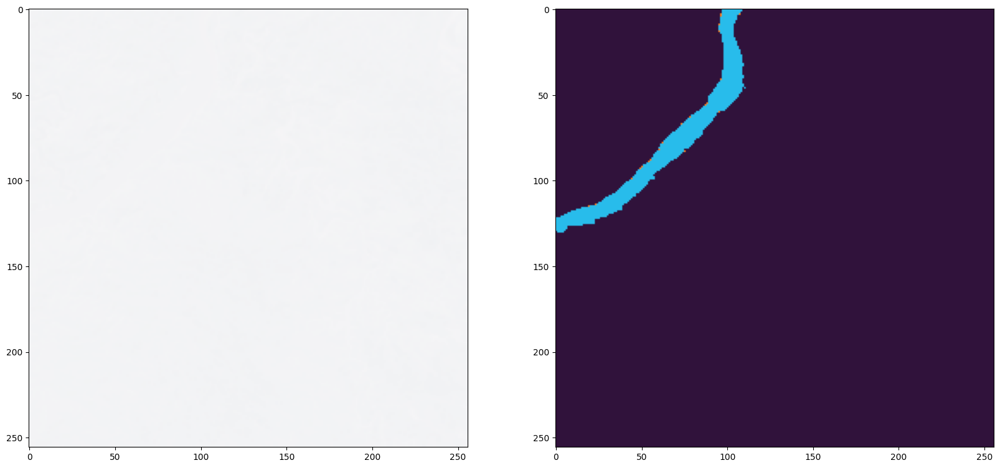

In [ ]:
_
#Sanity check, view few mages
import random
import numpy as np
image_number = random.randint(0, len(image_dataset))
plt.figure(figsize=(20, 10))
plt.subplot(121)
# plot_image_R = np.array(image_dataset[image_number,:,:,2])
# plot_image_G = np.array(image_dataset[image_number,:,:,1])
# plot_image_B = np.array(image_dataset[image_number,:,:,0])
plot_image_R = np.array(image_dataset[image_number,:,:,3])
plot_image_G = np.array(image_dataset[image_number,:,:,2])
plot_image_B = np.array(image_dataset[image_number,:,:,1])
plot_image = np.dstack((plot_image_R, plot_image_G, plot_image_B))
plot_image = (plot_image * 255.999) .astype(np.uint8)
#plt.imshow(plot_image, (patch_size, patch_size, 3)))
plt.imshow(plot_image)
plt.subplot(122)
#plt.imshow(np.reshape(mask_dataset[image_number,:,:,:3], (patch_size, patch_size, 3)))
#plt.imshow(mask_dataset[image_number])
plt.imshow(np.reshape(mask_dataset[image_number,:,:,:3], (patch_size, patch_size, 3)))
plt.savefig('New_Models/FCN_150/Sample_1.svg', format='svg')
plt.savefig('New_Models/FCN_150/Sample_1.pdf', format='pdf')
plt.show()

In [ ]:
#Do the same for all RGB channels in each hex code to convert to RGB

contaminated = '#FB7E21'.lstrip('#')
contaminated = np.array(tuple(int(contaminated[i:i+2], 16) for i in (0, 2, 4))) #132, 41, 246

clear = '#28BCEB'.lstrip('#')
clear = np.array(tuple(int(clear[i:i+2], 16) for i in (0, 2, 4))) #110, 193, 228

nowater = '#30123B'.lstrip('#')
nowater = np.array(tuple(int(nowater[i:i+2], 16) for i in (0, 2, 4))) #226, 169, 41

nodata = '#000000'.lstrip('#')
nodata = np.array(tuple(int(nodata[i:i+2], 16) for i in (0, 2, 4))) #226, 169, 41

label = single_patch_mask

In [ ]:

# Now replace RGB to integer values to be used as labels.
#Find pixels with combination of RGB for the above defined arrays...
#if matches then replace all values in that pixel with a specific integer
def rgb_to_2D_label(label):
    """
    Suply our labale masks as input in RGB format.
    Replace pixels with specific RGB values ...
    """
    label_seg = np.zeros(label.shape,dtype=np.uint8)
    label_seg [np.all(label==nodata,axis=-1)] = 0
    label_seg [np.all(label==nowater,axis=-1)] = 1
    label_seg [np.all(label == clear,axis=-1)] = 2
    label_seg [np.all(label==contaminated,axis=-1)] = 3


    label_seg = label_seg[:,:,0]  #Just take the first channel, no need for all 3 channels

    return label_seg

labels = []
for i in range(mask_dataset.shape[0]):
    label = rgb_to_2D_label(mask_dataset[i])
    labels.append(label)

labels = np.array(labels)
labels = np.expand_dims(labels, axis=3)


print("Unique labels in label dataset are: ", np.unique(labels))

Unique labels in label dataset are:  [0 1 2 3]


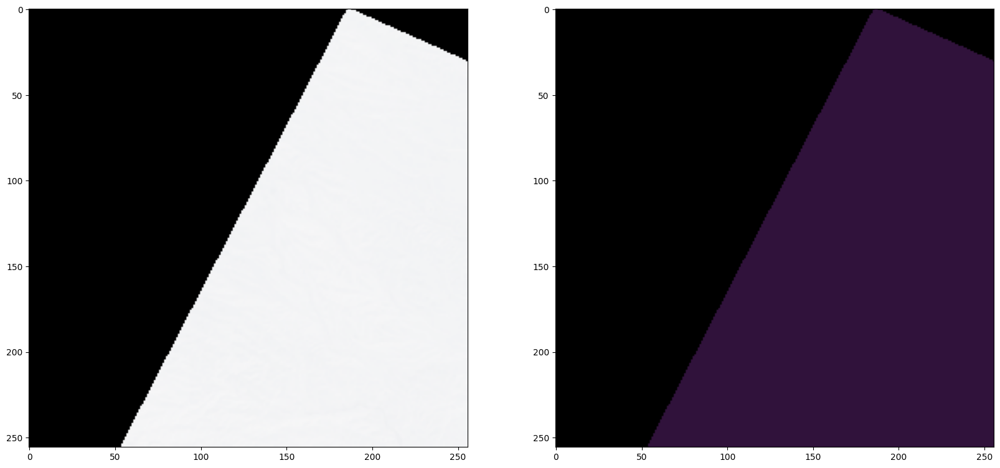

In [ ]:

#Another Sanity check, view few mages
import random
import numpy as np
image_number = random.randint(0, len(image_dataset))
plt.figure(figsize=(20, 10))
plt.subplot(121)
# plot_image_R = np.array(image_dataset[image_number,:,:,2])
# plot_image_G = np.array(image_dataset[image_number,:,:,1])
# plot_image_B = np.array(image_dataset[image_number,:,:,0])
plot_image_R = np.array(image_dataset[image_number,:,:,3])
plot_image_G = np.array(image_dataset[image_number,:,:,2])
plot_image_B = np.array(image_dataset[image_number,:,:,1])
plot_image = np.dstack((plot_image_R, plot_image_G, plot_image_B))
plot_image = (plot_image * 255.999) .astype(np.uint8)
#plt.imshow(plot_image, (patch_size, patch_size, 3)))
plt.imshow(plot_image)
plt.subplot(122)
#plt.imshow(labels[image_number][:,:,0])
plt.imshow(np.reshape(mask_dataset[image_number,:,:,:3], (patch_size, patch_size, 3)))
plt.savefig('New_Models/FCN_150/Sample_2.svg', format='svg')
plt.savefig('New_Models/FCN_150/Sample_2.pdf', format='pdf')
plt.show()

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical

n_classes = len(np.unique(labels))
labels_cat = to_categorical(labels, num_classes=n_classes)
batch_size = 32
# Example dataset shapes

# Split dataset into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(image_dataset, labels_cat, test_size = 0.20, random_state = 42)

# # Create an instance of ImageDataGenerator for data augmentation
# augmentation_datagen = ImageDataGenerator(
#     rotation_range=10,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     vertical_flip=True,
#     fill_mode='nearest'
# )

# # Create an instance of ImageDataGenerator for data validation (no augmentation)
# validation_datagen = ImageDataGenerator()

# # Generate augmented training data
# augmented_train_generator = augmentation_datagen.flow(
#     X_train,
#     y_train,
#     batch_size=batch_size,
#     seed=42
# )

# # Generate validation data (no augmentation)
# validation_generator = validation_datagen.flow(
#     X_val,
#     y_val,
#     batch_size=batch_size,
#     seed=42
# )

In [ ]:
# n_classes = len(np.unique(labels))
# from keras.utils import to_categorical
# labels_cat = to_categorical(labels, num_classes=n_classes)


# from sklearn.model_selection import train_test_split
# X_train, X_val, y_train, y_val = train_test_split(image_dataset, labels_cat, test_size = 0.20, random_state = 42)

# #X_train, X_val, y_train, y_val  = train_test_split(X_train, y_train, test_size=0.25)

# del image_dataset
# del labels_cat
# del mask_dataset

In [ ]:
X_train.shape

(593, 256, 256, 7)

In [ ]:
#######################################
#Parameters for model
# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss
from sklearn.utils.class_weight import compute_class_weight

#eights = compute_class_weight('balanced', np.unique(np.ravel(labels,order='C')),
#                               np.ravel(labels,order='C'))
unique_labels, label_counts = np.unique(labels, return_counts=True)
total_samples = len(labels)
class_weights = total_samples / (len(unique_labels) * label_counts)
weights = dict(zip(unique_labels, class_weights))



print(weights)
#from sklearn.utils import class_weight
#weights = [0.2,0.2, 0.2, 0.2, 0.2, 0.1]
#class_weights = class_weight.compute_class_weight('balanced',
#                                                 n_classes,
#                                                 y_train)
#dice_loss = sm.losses.DiceLoss(class_weights=weights)
#focal_loss = sm.losses.CategoricalFocalLoss()
#total_loss = dice_loss + (1 * focal_loss)  #
#total_loss = focal_loss

IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH  = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]

{0: 1.6931925899320303e-05, 1: 5.041234444224828e-06, 2: 0.0003263581248218665, 3: 0.0006039591065963404}


In [ ]:
from keras import backend as K
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection + smooth) / (K.sum(K.square(y_true),-1) + K.sum(K.square(y_pred),-1) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

#class_weights = [5.179519420733717e-06, 0.0004351441664291554, 0.0008052788087951206]
def loss(y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
    #class_weights = [5.179519420733717e-06, 0.0004351441664291554, 0.0008052788087951206]
    """
    Compute weighted Dice loss.
    :param y_true: True masks (tf.Tensor, shape=(<BATCH_SIZE>, <IMAGE_HEIGHT>, <IMAGE_WIDTH>, <N_CLASSES>))
    :param y_pred: Predicted masks (tf.Tensor, shape=(<BATCH_SIZE>, <IMAGE_HEIGHT>, <IMAGE_WIDTH>, <N_CLASSES>))
    :return: Weighted Dice loss (tf.Tensor, shape=(None,))
    """
    axis_to_reduce = range(1, K.ndim(y_pred))  # Reduce all axis but first (batch)
    numerator = y_true * y_pred * class_weights  # Broadcasting
    numerator = 2. * K.sum(numerator, axis=axis_to_reduce)

    denominator = (y_true + y_pred) * class_weights # Broadcasting
    denominator = K.sum(denominator, axis=axis_to_reduce)

    return 1 - numerator / denominator

def jacard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)


In [ ]:
#metrics=['accuracy', jacard_coef, dice_coef, dice_coef_loss, recall_m, precision_m, f1_m ]
metrics=['accuracy', jacard_coef, dice_coef, recall_m, precision_m, f1_m ]
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10, mode='min'),]
   # tf.keras.callbacks.ModelCheckpoint(filepath='New_Models/FCN_150/model.{epoch:02d}-{loss:.2f}.h5', save_best_only=True, monitor='loss', mode='min'),
    #tf.keras.callbacks.TensorBoard(log_dir='New_Models/FCN_150/logs')]

In [ ]:
def get_model():
    return FCN_150_8s(n_classes=n_classes, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_CHANNELS=IMG_CHANNELS)
model = get_model()
#model.compile(optimizer='adam', loss='mse', metrics=metrics)
#model.compile(optimizer='adam', loss=total_loss, metrics=metrics)
#model.compile(optimizer='rmsprop', loss=total_loss, metrics=metrics)
import tensorflow as tf
tf.random.set_seed(48)
from tensorflow import keras
#opt = keras.optimizers.Adam(learning_rate=0.0001)
opt = keras.optimizers.Adam(learning_rate=0.00001)

#model.compile(optimizer=opt, loss=total_loss, metrics=metrics)
#model.compile(optimizer=opt, loss=dice_coef_loss, metrics=metrics)
model.compile(optimizer=opt, loss=loss, metrics=metrics)
model.summary()



Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 7)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 256, 256, 32)         2048      ['input_2[0][0]']             
                                                                                                  
 dropout_7 (Dropout)         (None, 256, 256, 32)         0         ['block1_conv1[0][0]']        
                                                                                                  
 batch_normalization_19 (Ba  (None, 256, 256, 32)         128       ['dropout_7[0][0]']           
 tchNormalization)                                                                          

In [ ]:
# history1 = model.fit(augmented_train_generator,
#                     verbose=1,
#                     epochs=100,
#                     validation_data=validation_generator,
#                     callbacks=my_callbacks)


In [ ]:
# # history1 = model.fit(X_train, y_train,
# #                     batch_size=16,
# #                     verbose=2,
# #                     epochs=200,
# #                     validation_data=(X_val, y_val),
# #                     shuffle=False,
# #                     callbacks=my_callbacks)

# #weights =  np.array([0.000005179519420733717, 0.0004351441664291554, 0.0008052788087951206])

history1 = model.fit(X_train, y_train,
                    batch_size=8,
                    verbose=1,
                    epochs=150,
                    validation_data=(X_val, y_val),
                    shuffle=True,
                    callbacks=my_callbacks)


Epoch 1/150
75/75 [==============================] - 52s 297ms/step - loss: 0.9688 - accuracy: 0.2837 - jacard_coef: 0.1512 - dice_coef: 0.6673 - recall_m: 0.0280 - precision_m: 0.3727 - f1_m: 0.0519 - val_loss: 0.9690 - val_accuracy: 0.3879 - val_jacard_coef: 0.1512 - val_dice_coef: 0.6764 - val_recall_m: 2.3394e-04 - val_precision_m: 0.0791 - val_f1_m: 4.6358e-04
Epoch 2/150
75/75 [==============================] - 18s 234ms/step - loss: 0.9604 - accuracy: 0.4047 - jacard_coef: 0.1818 - dice_coef: 0.6986 - recall_m: 0.1080 - precision_m: 0.7435 - f1_m: 0.1879 - val_loss: 0.9617 - val_accuracy: 0.4535 - val_jacard_coef: 0.1727 - val_dice_coef: 0.6989 - val_recall_m: 0.0795 - val_precision_m: 0.9316 - val_f1_m: 0.1453
Epoch 3/150
75/75 [==============================] - 17s 232ms/step - loss: 0.9517 - accuracy: 0.5033 - jacard_coef: 0.2049 - dice_coef: 0.7175 - recall_m: 0.1486 - precision_m: 0.7398 - f1_m: 0.2466 - val_loss: 0.9515 - val_accuracy: 0.5791 - val_jacard_coef: 0.2006 - va

In [ ]:
model.save_model('7ch_non_augmented_4class_fcn_150E.h5')

In [ ]:
model.save('7ch_non_augmented_4class_fcn_150E_save.h5')

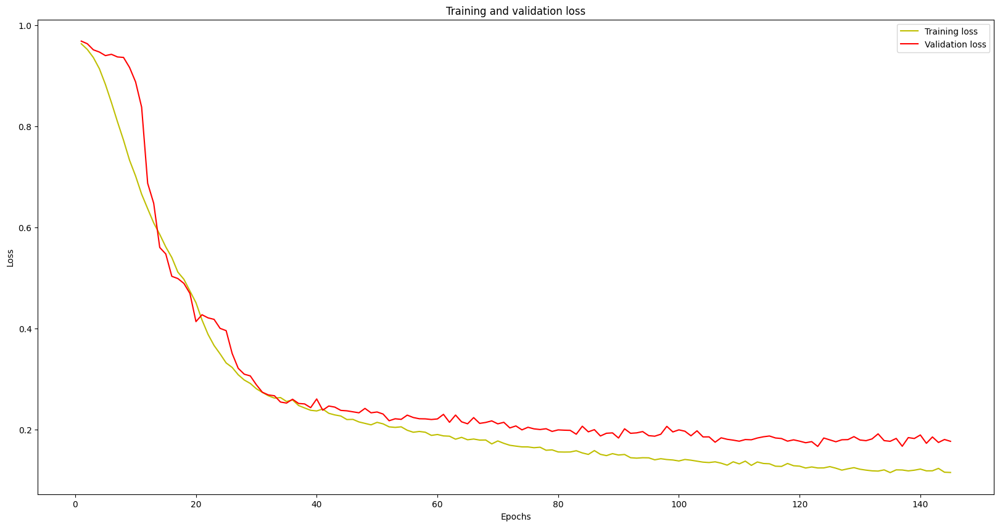

In [ ]:
###########################################################
#plot the training and validation accuracy and loss at each epoch
history = history1
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure(figsize=(20, 10))
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('New_Models/FCN_150/Train_val_loss_FCN_150.svg', format='svg')
plt.savefig('New_Models/FCN_150/Train_val_loss_FCN_150.pdf')
plt.show()


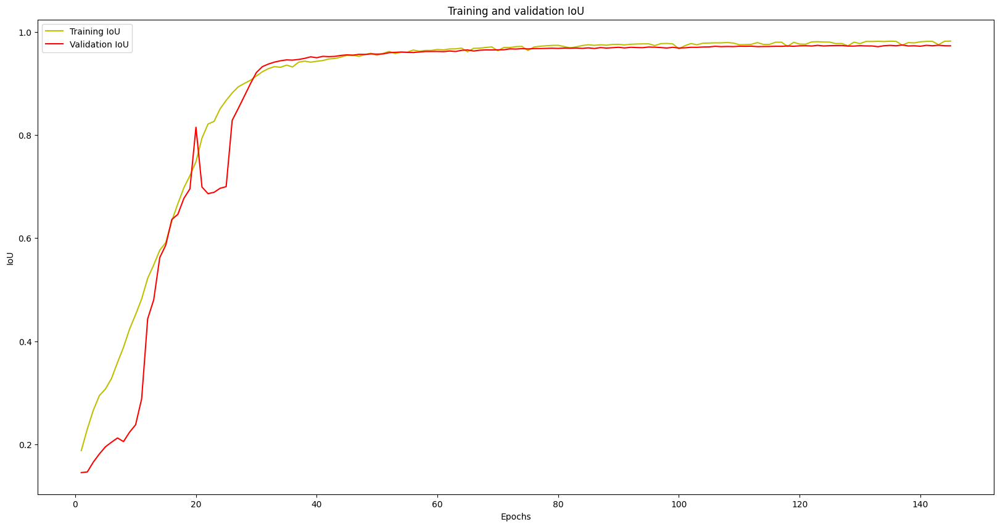

In [ ]:
jcoef = history.history['jacard_coef']
val_jcoef = history.history['val_jacard_coef']
plt.figure(figsize=(20, 10))
plt.plot(epochs, jcoef, 'y', label='Training IoU')
plt.plot(epochs, val_jcoef, 'r', label='Validation IoU')
plt.title('Training and validation IoU')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.savefig('New_Models/FCN_150/Train_val_IoU_FCN_150.svg', format='svg')
plt.savefig('New_Models/FCN_150/Train_val_IoU_FCN_150.pdf')
plt.show()


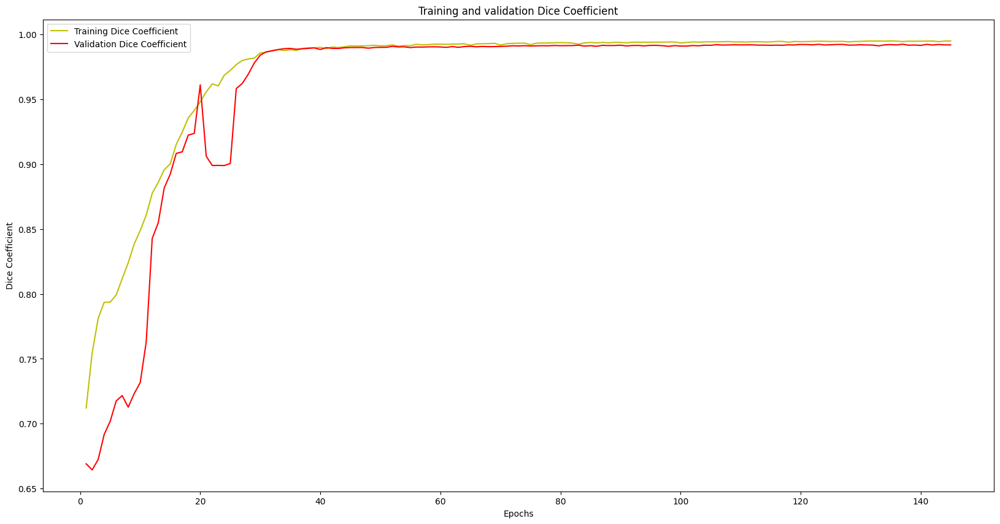

In [ ]:
dcoef = history1.history['dice_coef']
val_dcoef = history1.history['val_dice_coef']
plt.figure(figsize=(20, 10))
plt.plot(epochs, dcoef, 'y', label='Training Dice Coefficient')
plt.plot(epochs, val_dcoef, 'r', label='Validation Dice Coefficient')
plt.title('Training and validation Dice Coefficient')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend()
plt.savefig('New_Models/FCN_150/Dice_coef_FCN_150.svg', format='svg')
plt.savefig('New_Models/FCN_150/Dice_coef_FCN_150.png', format='png')
plt.show()

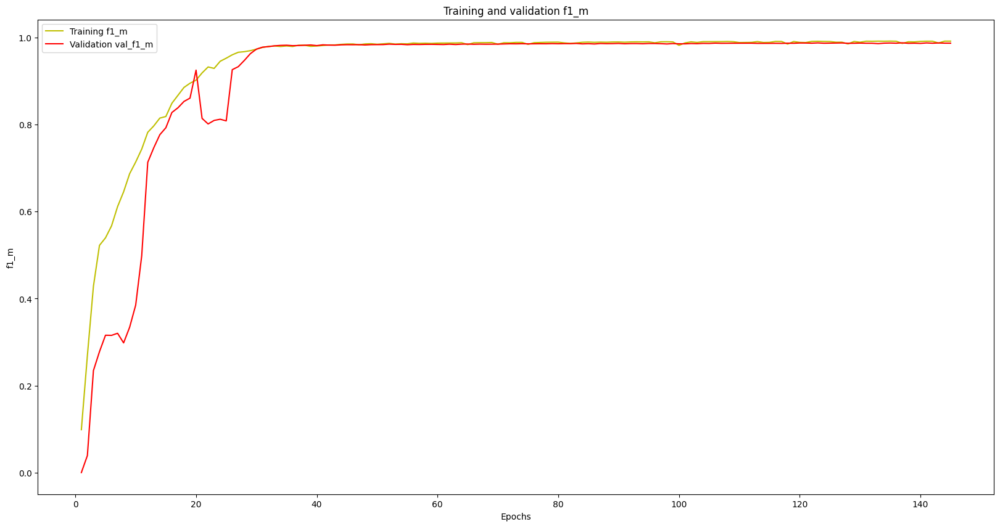

In [ ]:
f1_m = history1.history['f1_m']
val_f1_m = history1.history['val_f1_m']
plt.figure(figsize=(20, 10))
plt.plot(epochs, f1_m, 'y', label='Training f1_m')
plt.plot(epochs, val_f1_m, 'r', label='Validation val_f1_m')
plt.title('Training and validation f1_m')
plt.xlabel('Epochs')
plt.ylabel('f1_m')
plt.legend()
plt.savefig('New_Models/FCN_150/F1_m_FCN_150.svg', format='svg')
plt.savefig('New_Models/FCN_150/F1_m_FCN_150.png', format='png')
plt.show()


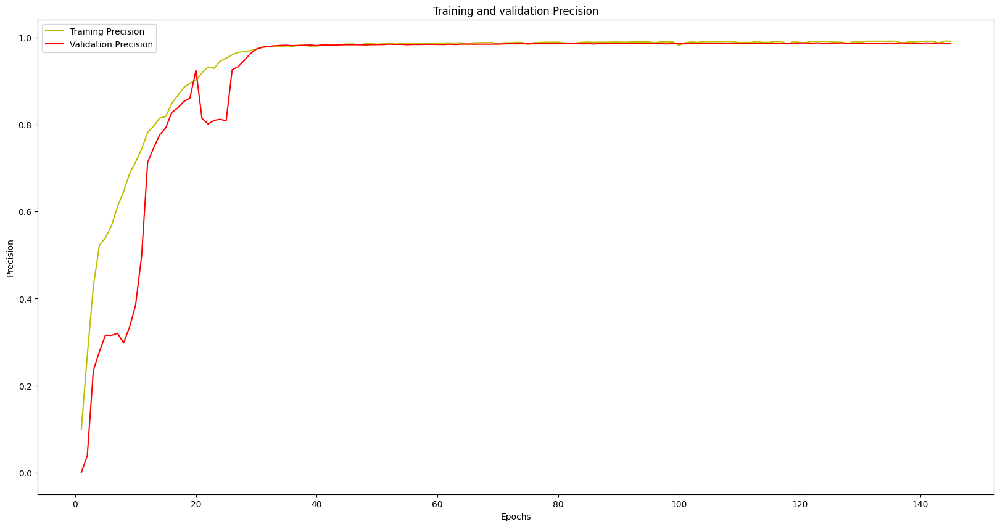

In [ ]:
pre_m = history1.history['precision_m']
val_pre_m = history1.history['val_precision_m']
plt.figure(figsize=(20, 10))
plt.plot(epochs, f1_m, 'y', label='Training Precision')
plt.plot(epochs, val_f1_m, 'r', label='Validation Precision')
plt.title('Training and validation Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()
plt.savefig('New_Models/FCN_150/Precision_FCN_150.svg', format='svg')
plt.savefig('New_Models/FCN_150/Precision_FCN_150.png', format='png')
plt.show()


### Predictions

In [ ]:
# MIT License
# Copyright (c) 2017 Vooban Inc.
# Coded by: Guillaume Chevalier
# Source to original code and license:
#     https://github.com/Vooban/Smoothly-Blend-Image-Patches
#     https://github.com/Vooban/Smoothly-Blend-Image-Patches/blob/master/LICENSE


"""Do smooth predictions on an image from tiled prediction patches."""


import numpy as np
import scipy.signal
from tqdm import tqdm

import gc

PLOT_PROGRESS = False
def _spline_window(window_size, power=2):
    """
    Squared spline (power=2) window function:
    https://www.wolframalpha.com/input/?i=y%3Dx**2,+y%3D-(x-2)**2+%2B2,+y%3D(x-4)**2,+from+y+%3D+0+to+2
    """
    intersection = int(window_size/4)
    wind_outer = (abs(2*(scipy.signal.triang(window_size))) ** power)/2
    wind_outer[intersection:-intersection] = 0

    wind_inner = 1 - (abs(2*(scipy.signal.triang(window_size) - 1)) ** power)/2
    wind_inner[:intersection] = 0
    wind_inner[-intersection:] = 0

    wind = wind_inner + wind_outer
    wind = wind / np.average(wind)
    return wind


cached_2d_windows = dict()
def _window_2D(window_size, power=2):
    """
    Make a 1D window function, then infer and return a 2D window function.
    Done with an augmentation, and self multiplication with its transpose.
    Could be generalized to more dimensions.
    """
    # Memoization
    global cached_2d_windows
    key = "{}_{}".format(window_size, power)
    if key in cached_2d_windows:
        wind = cached_2d_windows[key]
    else:
        wind = _spline_window(window_size, power)
        #wind = np.expand_dims(np.expand_dims(wind, 3), 3)
        wind = np.expand_dims(np.expand_dims(wind, 1), 1)
        wind = wind * wind.transpose(1, 0, 2)
        if PLOT_PROGRESS:
            # For demo purpose, let's look once at the window:
            plt.imshow(wind[:, :, 0], cmap="viridis")
            plt.title("2D Windowing Function for a Smooth Blending of "
                      "Overlapping Patches")
            plt.show()
        cached_2d_windows[key] = wind
    return wind


def _pad_img(img, window_size, subdivisions):
    """
    Add borders to img for a "valid" border pattern according to "window_size" and
    "subdivisions".
    Image is an np array of shape (x, y, nb_channels).
    """
    aug = int(round(window_size * (1 - 1.0/subdivisions)))
    more_borders = ((aug, aug), (aug, aug), (0, 0))
    ret = np.pad(img, pad_width=more_borders, mode='reflect')
    # gc.collect()

    if PLOT_PROGRESS:
        # For demo purpose, let's look once at the window:
        plt.imshow(ret)
        plt.title("Padded Image for Using Tiled Prediction Patches\n"
                  "(notice the reflection effect on the padded borders)")
        plt.show()
    return ret


def _unpad_img(padded_img, window_size, subdivisions):
    """
    Undo what's done in the `_pad_img` function.
    Image is an np array of shape (x, y, nb_channels).
    """
    aug = int(round(window_size * (1 - 1.0/subdivisions)))
    ret = padded_img[
        aug:-aug,
        aug:-aug,
        :
    ]
    # gc.collect()
    return ret


def _rotate_mirror_do(im):
    """
    Duplicate an np array (image) of shape (x, y, nb_channels) 8 times, in order
    to have all the possible rotations and mirrors of that image that fits the
    possible 90 degrees rotations.

    It is the D_4 (D4) Dihedral group:
    https://en.wikipedia.org/wiki/Dihedral_group
    """
    mirrs = []
    mirrs.append(np.array(im))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=1))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=2))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=3))
    im = np.array(im)[:, ::-1]
    mirrs.append(np.array(im))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=1))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=2))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=3))
    return mirrs


def _rotate_mirror_undo(im_mirrs):
    """
    merges a list of 8 np arrays (images) of shape (x, y, nb_channels) generated
    from the `_rotate_mirror_do` function. Each images might have changed and
    merging them implies to rotated them back in order and average things out.

    It is the D_4 (D4) Dihedral group:
    https://en.wikipedia.org/wiki/Dihedral_group
    """
    origs = []
    origs.append(np.array(im_mirrs[0]))
    origs.append(np.rot90(np.array(im_mirrs[1]), axes=(0, 1), k=3))
    origs.append(np.rot90(np.array(im_mirrs[2]), axes=(0, 1), k=2))
    origs.append(np.rot90(np.array(im_mirrs[3]), axes=(0, 1), k=1))
    origs.append(np.array(im_mirrs[4])[:, ::-1])
    origs.append(np.rot90(np.array(im_mirrs[5]), axes=(0, 1), k=3)[:, ::-1])
    origs.append(np.rot90(np.array(im_mirrs[6]), axes=(0, 1), k=2)[:, ::-1])
    origs.append(np.rot90(np.array(im_mirrs[7]), axes=(0, 1), k=1)[:, ::-1])
    return np.mean(origs, axis=0)


def _windowed_subdivs(padded_img, window_size, subdivisions, nb_classes, pred_func):
    """
    Create tiled overlapping patches.

    Returns:
        5D numpy array of shape = (
            nb_patches_along_X,
            nb_patches_along_Y,
            patches_resolution_along_X,
            patches_resolution_along_Y,
            nb_output_channels
        )

    Note:
        patches_resolution_along_X == patches_resolution_along_Y == window_size
    """
    WINDOW_SPLINE_2D = _window_2D(window_size=window_size, power=2)

    step = int(window_size/subdivisions)
    padx_len = padded_img.shape[0]
    pady_len = padded_img.shape[1]
    subdivs = []

    for i in range(0, padx_len-window_size+1, step):
        subdivs.append([])
        #for j in range(0, padx_len-window_size+1, step):
        for j in range(0, pady_len-window_size+1, step):
            patch = padded_img[i:i+window_size, j:j+window_size, :]
            subdivs[-1].append(patch)

    # Here, `gc.collect()` clears RAM between operations.
    # It should run faster if they are removed, if enough memory is available.
    gc.collect()
    subdivs = np.array(subdivs)
    gc.collect()
    a, b, c, d, e = subdivs.shape
    subdivs = subdivs.reshape(a * b, c, d, e)
    gc.collect()

    subdivs = pred_func(subdivs)
    gc.collect()
    subdivs = np.array([patch * WINDOW_SPLINE_2D for patch in subdivs])
    gc.collect()

    # Such 5D array:
    subdivs = subdivs.reshape(a, b, c, d, nb_classes)
    gc.collect()

    return subdivs


def _recreate_from_subdivs(subdivs, window_size, subdivisions, padded_out_shape):
    """
    Merge tiled overlapping patches smoothly.
    """
    step = int(window_size/subdivisions)
    padx_len = padded_out_shape[0]
    pady_len = padded_out_shape[1]

    y = np.zeros(padded_out_shape)

    a = 0
    for i in range(0, padx_len-window_size+1, step):
        b = 0
        #for j in range(0, padx_len-window_size+1, step):
        for j in range(0, pady_len-window_size+1, step):
            windowed_patch = subdivs[a, b]
            y[i:i+window_size, j:j+window_size] = y[i:i+window_size, j:j+window_size] + windowed_patch
            b += 1
        a += 1
    return y / (subdivisions ** 2)


def predict_img_with_smooth_windowing(input_img, window_size, subdivisions, nb_classes, pred_func):
    """
    Apply the `pred_func` function to square patches of the image, and overlap
    the predictions to merge them smoothly.

    See 6th, 7th and 8th idea here:
    http://blog.kaggle.com/2017/05/09/dstl-satellite-imagery-competition-3rd-place-winners-interview-vladimir-sergey/
    """
    pad = _pad_img(input_img, window_size, subdivisions)
    pads = _rotate_mirror_do(pad)

    # Note that the implementation could be more memory-efficient by merging
    # the behavior of `_windowed_subdivs` and `_recreate_from_subdivs` into
    # one loop doing in-place assignments to the new image matrix, rather than
    # using a temporary 5D array.

    # It would also be possible to allow different (and impure) window functions
    # that might not tile well. Adding their weighting to another matrix could
    # be done to later normalize the predictions correctly by dividing the whole
    # reconstructed thing by this matrix of weightings - to normalize things
    # back from an impure windowing function that would have badly weighted
    # windows.

    # For example, since the U-net of Kaggle's DSTL satellite imagery feature
    # prediction challenge's 3rd place winners use a different window size for
    # the input and output of the neural net's patches predictions, it would be
    # possible to fake a full-size window which would in fact just have a narrow
    # non-zero dommain. This may require to augment the `subdivisions` argument
    # to 4 rather than 2.

    res = []
    for pad in tqdm(pads):
        # For every rotation:
        sd = _windowed_subdivs(pad, window_size, subdivisions, nb_classes, pred_func)
        one_padded_result = _recreate_from_subdivs(
            sd, window_size, subdivisions,
            padded_out_shape=list(pad.shape[:-1])+[nb_classes])

        res.append(one_padded_result)

    # Merge after rotations:
    padded_results = _rotate_mirror_undo(res)

    prd = _unpad_img(padded_results, window_size, subdivisions)

    prd = prd[:input_img.shape[0], :input_img.shape[1], :]

    if PLOT_PROGRESS:
        plt.imshow(prd)
        plt.title("Smoothly Merged Patches that were Tiled Tighter")
        plt.show()
    return prd


def cheap_tiling_prediction(img, window_size, nb_classes, pred_func):
    """
    Does predictions on an image without tiling.
    """
    original_shape = img.shape
    full_border = img.shape[0] + (window_size - (img.shape[0] % window_size))
    prd = np.zeros((full_border, full_border, nb_classes))
    tmp = np.zeros((full_border, full_border, original_shape[-1]))
    tmp[:original_shape[0], :original_shape[1], :] = img
    img = tmp
    print(img.shape, tmp.shape, prd.shape)
    for i in tqdm(range(0, prd.shape[0], window_size)):
        for j in range(0, prd.shape[0], window_size):
            im = img[i:i+window_size, j:j+window_size]
            prd[i:i+window_size, j:j+window_size] = pred_func([im])
    prd = prd[:original_shape[0], :original_shape[1]]
    if PLOT_PROGRESS:
        plt.imshow(prd)
        plt.title("Cheaply Merged Patches")
        plt.show()
    return prd


def get_dummy_img(xy_size=128, nb_channels=3):
    """
    Create a random image with different luminosity in the corners.

    Returns an array of shape (xy_size, xy_size, nb_channels).
    """
    x = np.random.random((xy_size, xy_size, nb_channels))
    x = x + np.ones((xy_size, xy_size, 1))
    lin = np.expand_dims(
        np.expand_dims(
            np.linspace(0, 1, xy_size),
            nb_channels),
        nb_channels)
    x = x * lin
    x = x * lin.transpose(1, 0, 2)
    x = x + x[::-1, ::-1, :]
    x = x - np.min(x)
    x = x / np.max(x) / 2
    gc.collect()
    if PLOT_PROGRESS:
        plt.imshow(x)
        plt.title("Random image for a test")
        plt.show()
    return x


def round_predictions(prd, nb_channels_out, thresholds):
    """
    From a threshold list `thresholds` containing one threshold per output
    channel for comparison, the predictions are converted to a binary mask.
    """
    assert (nb_channels_out == len(thresholds))
    prd = np.array(prd)
    for i in range(nb_channels_out):
        # Per-pixel and per-channel comparison on a threshold to
        # binarize prediction masks:
        prd[:, :, i] = prd[:, :, i] > thresholds[i]
    return prd




/content/gdrive/MyDrive/NUST MSDS/Processed_Data
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab/logs
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab/logs/train
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab/logs/validation
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_raw_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_raw_pred
1/1 [==============================] - 0s 23ms/step
LC08_L2SP_149035_20131009_20200912_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█▎        | 1/8 [00:01<00:13,  1.97s/it]

1/1 [==============================] - 0s 63ms/step


 25%|██▌       | 2/8 [00:03<00:11,  1.97s/it]

1/1 [==============================] - 0s 57ms/step


 38%|███▊      | 3/8 [00:05<00:09,  1.98s/it]

1/1 [==============================] - 0s 77ms/step


 50%|█████     | 4/8 [00:08<00:08,  2.15s/it]

1/1 [==============================] - 0s 63ms/step


 62%|██████▎   | 5/8 [00:10<00:06,  2.05s/it]

1/1 [==============================] - 0s 49ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  1.95s/it]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 7/8 [00:13<00:01,  1.88s/it]

1/1 [==============================] - 0s 65ms/step


100%|██████████| 8/8 [00:15<00:00,  1.94s/it]


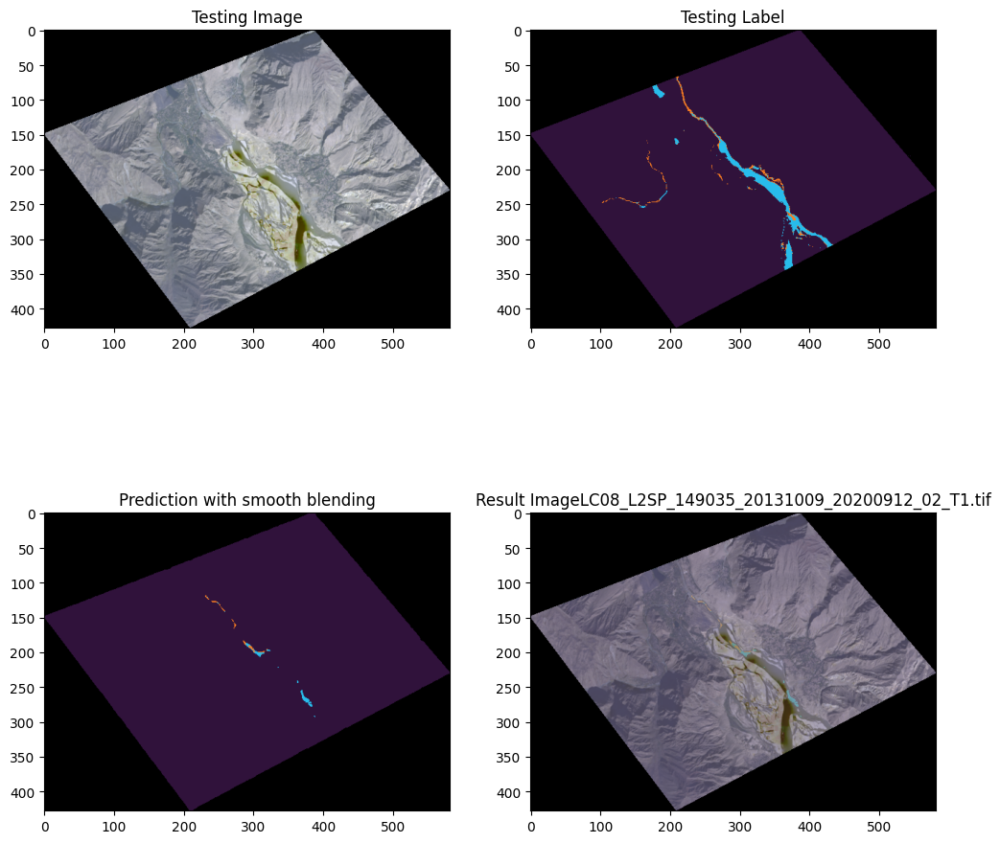

1/1 [==============================] - 0s 32ms/step
LC08_L2SP_149035_20150116_20200910_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 61ms/step


 12%|█▎        | 1/8 [00:01<00:13,  1.91s/it]

1/1 [==============================] - 0s 84ms/step


 25%|██▌       | 2/8 [00:04<00:12,  2.15s/it]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 3/8 [00:06<00:10,  2.02s/it]

1/1 [==============================] - 0s 79ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.94s/it]

1/1 [==============================] - 0s 46ms/step


 62%|██████▎   | 5/8 [00:09<00:05,  1.87s/it]

1/1 [==============================] - 0s 65ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  1.85s/it]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 7/8 [00:13<00:01,  1.86s/it]

1/1 [==============================] - 0s 61ms/step


100%|██████████| 8/8 [00:15<00:00,  1.93s/it]


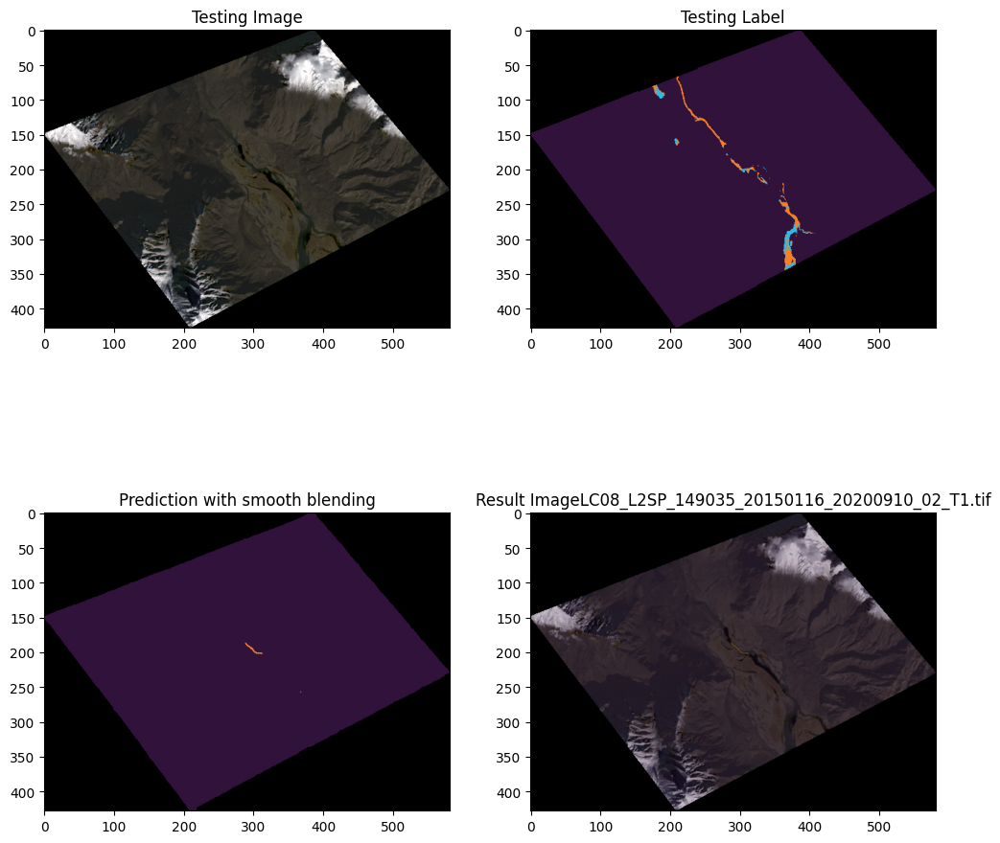

1/1 [==============================] - 0s 26ms/step
LC08_L2SP_149035_20151218_20200908_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 60ms/step


 12%|█▎        | 1/8 [00:01<00:13,  1.91s/it]

1/1 [==============================] - 0s 50ms/step


 25%|██▌       | 2/8 [00:03<00:11,  1.87s/it]

1/1 [==============================] - 0s 62ms/step


 38%|███▊      | 3/8 [00:05<00:09,  1.82s/it]

1/1 [==============================] - 0s 62ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.87s/it]

1/1 [==============================] - 0s 63ms/step


 62%|██████▎   | 5/8 [00:09<00:05,  1.84s/it]

1/1 [==============================] - 0s 78ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  2.00s/it]

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 7/8 [00:13<00:01,  2.00s/it]

1/1 [==============================] - 0s 49ms/step


100%|██████████| 8/8 [00:15<00:00,  1.90s/it]


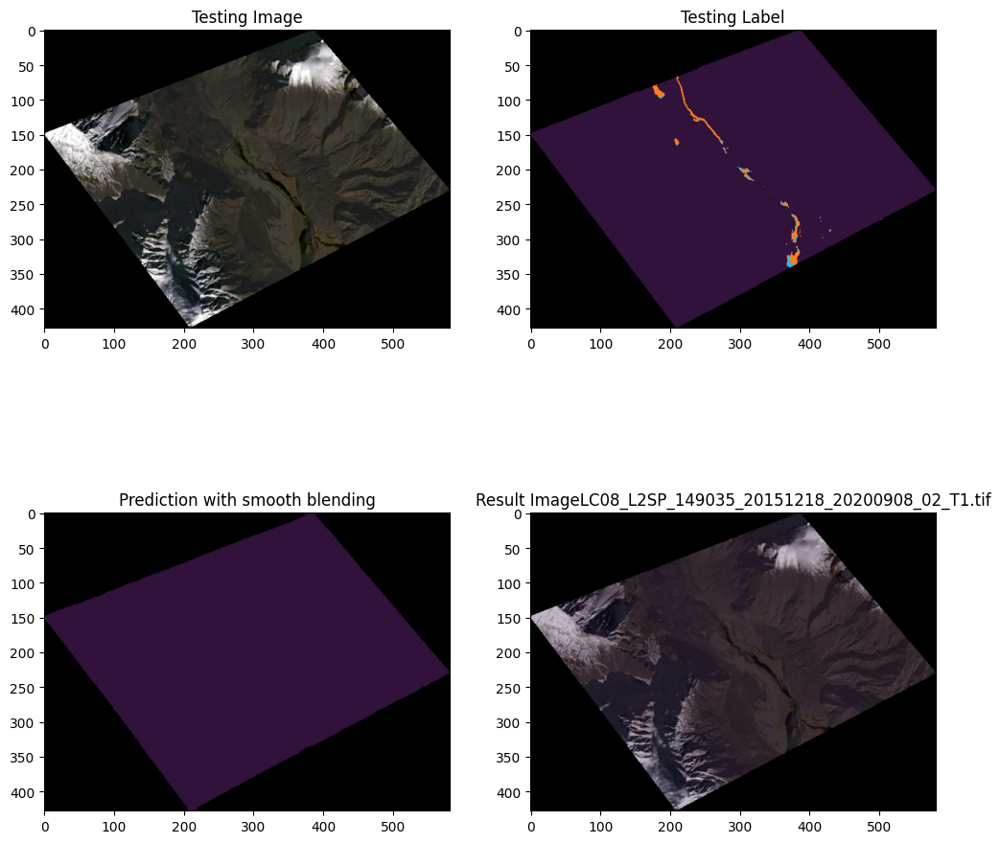

1/1 [==============================] - 0s 28ms/step
LC08_L2SP_149035_20170411_20200904_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 60ms/step


 12%|█▎        | 1/8 [00:01<00:12,  1.78s/it]

1/1 [==============================] - 0s 43ms/step


 25%|██▌       | 2/8 [00:03<00:10,  1.74s/it]

1/1 [==============================] - 0s 62ms/step


 38%|███▊      | 3/8 [00:05<00:08,  1.76s/it]

1/1 [==============================] - 0s 54ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.98s/it]

1/1 [==============================] - 0s 61ms/step


 62%|██████▎   | 5/8 [00:09<00:05,  1.94s/it]

1/1 [==============================] - 0s 64ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  1.86s/it]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 7/8 [00:12<00:01,  1.82s/it]

1/1 [==============================] - 0s 63ms/step


100%|██████████| 8/8 [00:14<00:00,  1.83s/it]


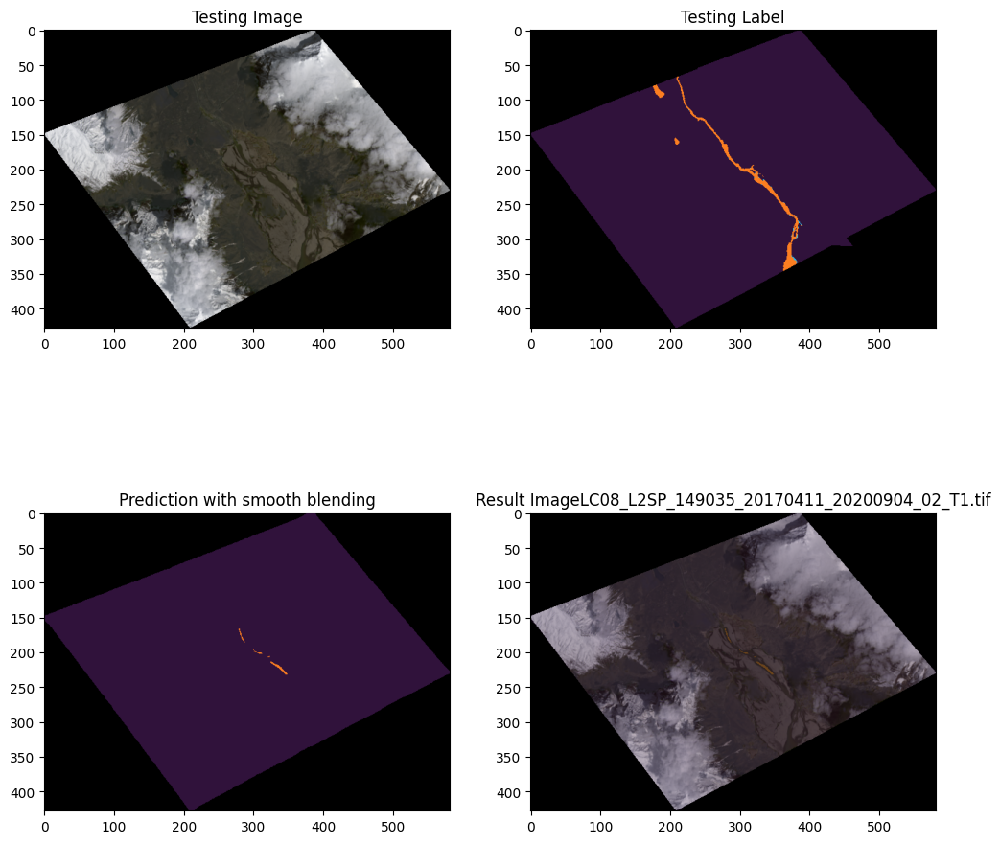

1/1 [==============================] - 0s 22ms/step
LC08_L2SP_149035_20191111_20200825_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 60ms/step


 12%|█▎        | 1/8 [00:02<00:14,  2.01s/it]

1/1 [==============================] - 0s 73ms/step


 25%|██▌       | 2/8 [00:04<00:12,  2.11s/it]

1/1 [==============================] - 0s 61ms/step


 38%|███▊      | 3/8 [00:05<00:09,  1.95s/it]

1/1 [==============================] - 0s 61ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.92s/it]

1/1 [==============================] - 0s 53ms/step


 62%|██████▎   | 5/8 [00:09<00:05,  1.90s/it]

1/1 [==============================] - 0s 59ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  1.83s/it]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 7/8 [00:13<00:01,  1.79s/it]

1/1 [==============================] - 0s 68ms/step


100%|██████████| 8/8 [00:15<00:00,  1.88s/it]


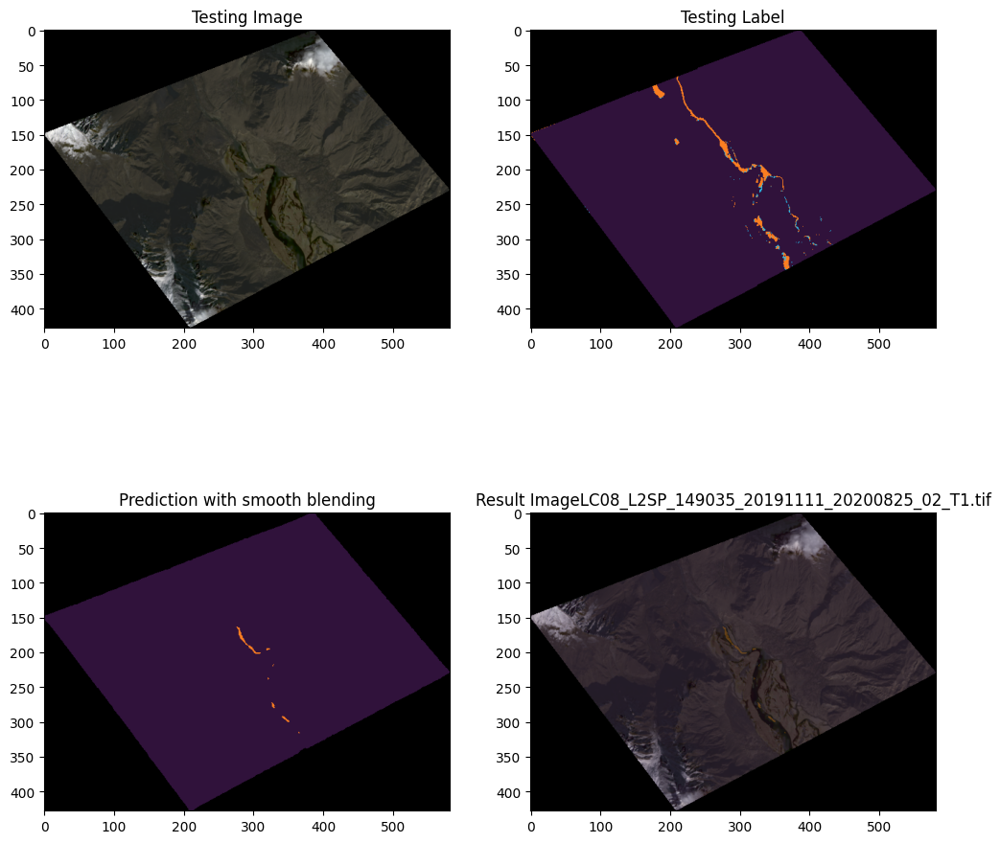

/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_fixed_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_b_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_b
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_rgb
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_rgb_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_4class
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_4class_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/masks_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/masks_fixed_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/images_raw_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/images_raw_pred
1/1 [==============================] - 0s 33ms/step
LC08_L2SP_150036_20131117_20200912_02_T1.t

  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 62ms/step


 12%|█▎        | 1/8 [00:01<00:13,  1.86s/it]

1/1 [==============================] - 0s 60ms/step


 25%|██▌       | 2/8 [00:03<00:10,  1.75s/it]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 3/8 [00:05<00:08,  1.71s/it]

1/1 [==============================] - 0s 64ms/step


 50%|█████     | 4/8 [00:06<00:06,  1.69s/it]

1/1 [==============================] - 0s 60ms/step


 62%|██████▎   | 5/8 [00:08<00:05,  1.71s/it]

1/1 [==============================] - 0s 67ms/step


 75%|███████▌  | 6/8 [00:10<00:03,  1.81s/it]

1/1 [==============================] - 0s 100ms/step


 88%|████████▊ | 7/8 [00:13<00:02,  2.04s/it]

1/1 [==============================] - 0s 80ms/step


100%|██████████| 8/8 [00:15<00:00,  1.92s/it]


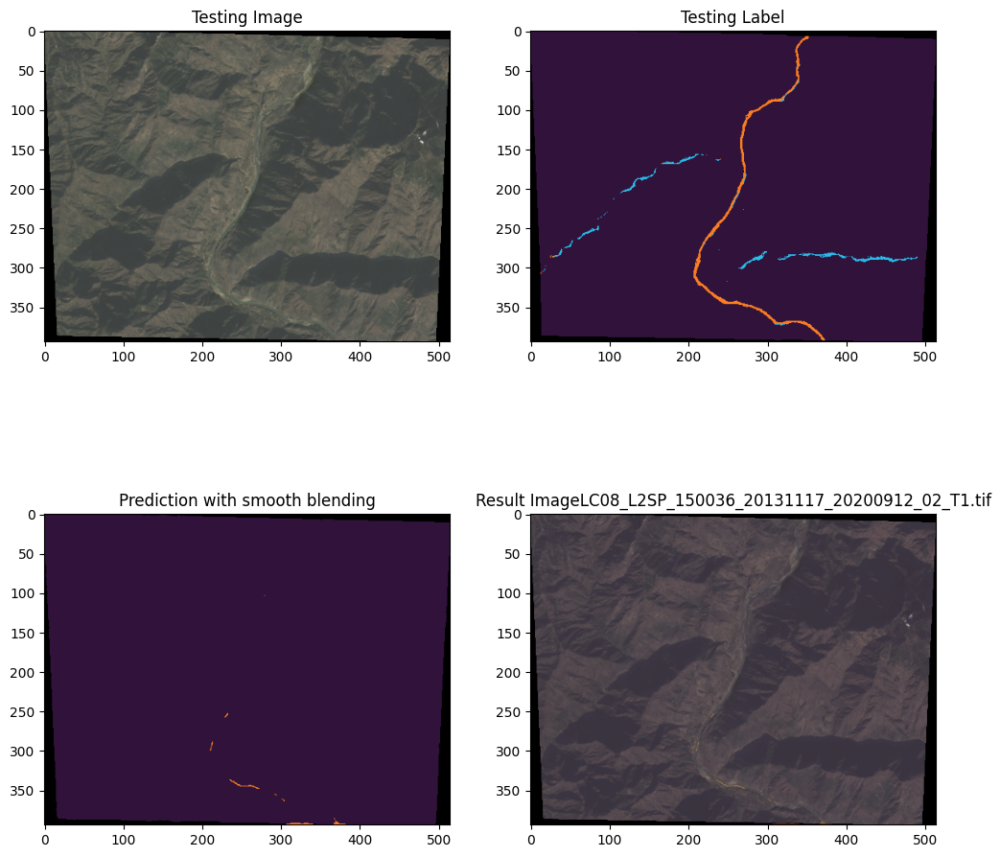

1/1 [==============================] - 0s 25ms/step
LC08_L2SP_150036_20150515_20200909_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█▎        | 1/8 [00:01<00:12,  1.78s/it]

1/1 [==============================] - 0s 60ms/step


 25%|██▌       | 2/8 [00:03<00:10,  1.74s/it]

1/1 [==============================] - 0s 69ms/step


 38%|███▊      | 3/8 [00:05<00:08,  1.78s/it]

1/1 [==============================] - 0s 44ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.79s/it]

1/1 [==============================] - 0s 61ms/step


 62%|██████▎   | 5/8 [00:09<00:05,  1.95s/it]

1/1 [==============================] - 0s 51ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  1.93s/it]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 7/8 [00:12<00:01,  1.87s/it]

1/1 [==============================] - 0s 58ms/step


100%|██████████| 8/8 [00:14<00:00,  1.84s/it]


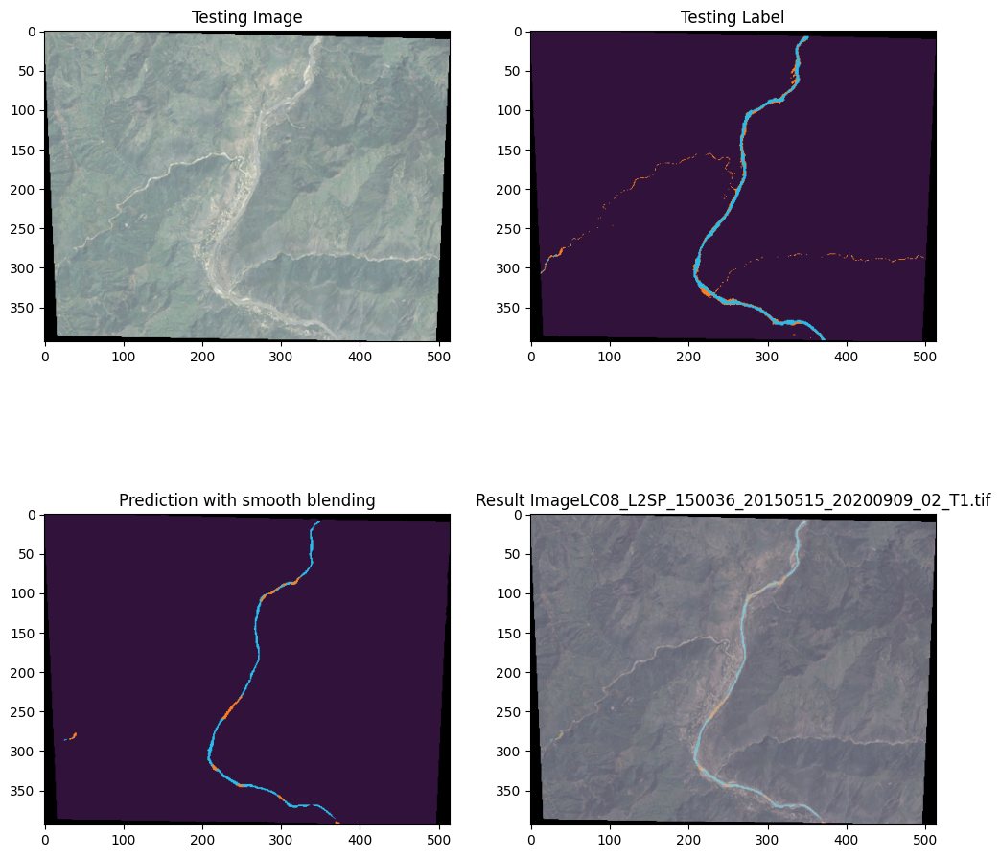

1/1 [==============================] - 0s 40ms/step
LC08_L2SP_150036_20161227_20200905_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 60ms/step


 12%|█▎        | 1/8 [00:01<00:12,  1.76s/it]

1/1 [==============================] - 0s 44ms/step


 25%|██▌       | 2/8 [00:03<00:11,  1.85s/it]

1/1 [==============================] - 0s 59ms/step


 38%|███▊      | 3/8 [00:05<00:09,  2.00s/it]

1/1 [==============================] - 0s 59ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.90s/it]

1/1 [==============================] - 0s 44ms/step


 62%|██████▎   | 5/8 [00:09<00:05,  1.87s/it]

1/1 [==============================] - 0s 67ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  1.85s/it]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 7/8 [00:12<00:01,  1.79s/it]

1/1 [==============================] - 0s 63ms/step


100%|██████████| 8/8 [00:14<00:00,  1.82s/it]


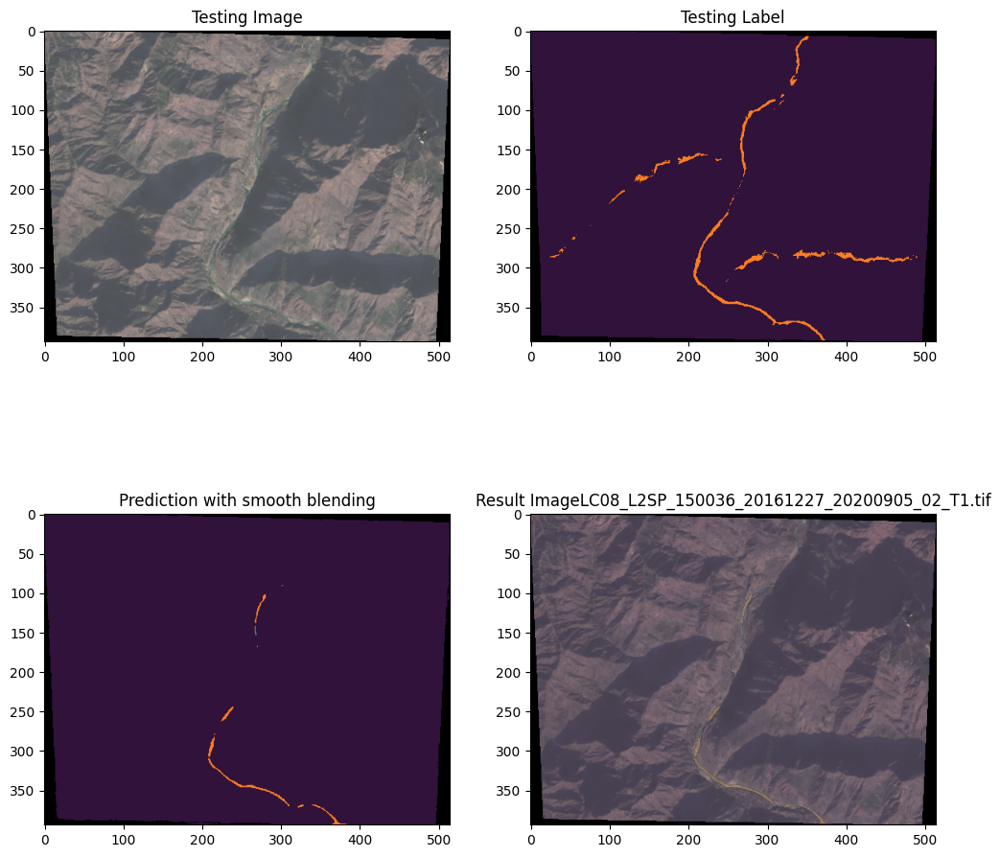

1/1 [==============================] - 0s 29ms/step
LC08_L2SP_150036_20171230_20200902_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 63ms/step


 12%|█▎        | 1/8 [00:02<00:15,  2.26s/it]

1/1 [==============================] - 0s 49ms/step


 25%|██▌       | 2/8 [00:04<00:12,  2.02s/it]

1/1 [==============================] - 0s 58ms/step


 38%|███▊      | 3/8 [00:05<00:09,  1.86s/it]

1/1 [==============================] - 0s 69ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.84s/it]

1/1 [==============================] - 0s 49ms/step


 62%|██████▎   | 5/8 [00:09<00:05,  1.77s/it]

1/1 [==============================] - 0s 44ms/step


 75%|███████▌  | 6/8 [00:10<00:03,  1.76s/it]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 7/8 [00:12<00:01,  1.83s/it]

1/1 [==============================] - 0s 83ms/step


100%|██████████| 8/8 [00:15<00:00,  1.89s/it]


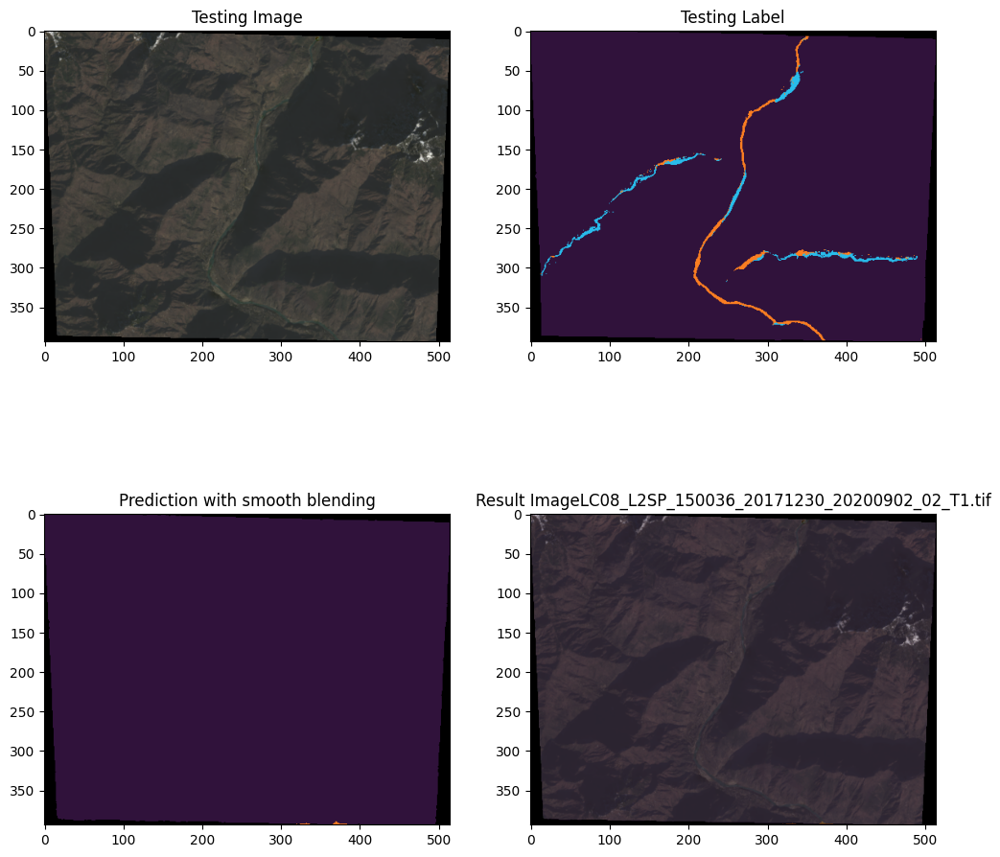

1/1 [==============================] - 0s 30ms/step
LC08_L2SP_150036_20190219_20200829_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 60ms/step


 12%|█▎        | 1/8 [00:01<00:13,  1.93s/it]

1/1 [==============================] - 0s 67ms/step


 25%|██▌       | 2/8 [00:03<00:11,  1.91s/it]

1/1 [==============================] - 0s 69ms/step


 38%|███▊      | 3/8 [00:05<00:09,  1.89s/it]

1/1 [==============================] - 0s 61ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.87s/it]

1/1 [==============================] - 0s 55ms/step


 62%|██████▎   | 5/8 [00:09<00:05,  1.97s/it]

1/1 [==============================] - 0s 60ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  1.95s/it]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 7/8 [00:13<00:01,  1.91s/it]

1/1 [==============================] - 0s 46ms/step


100%|██████████| 8/8 [00:15<00:00,  1.89s/it]


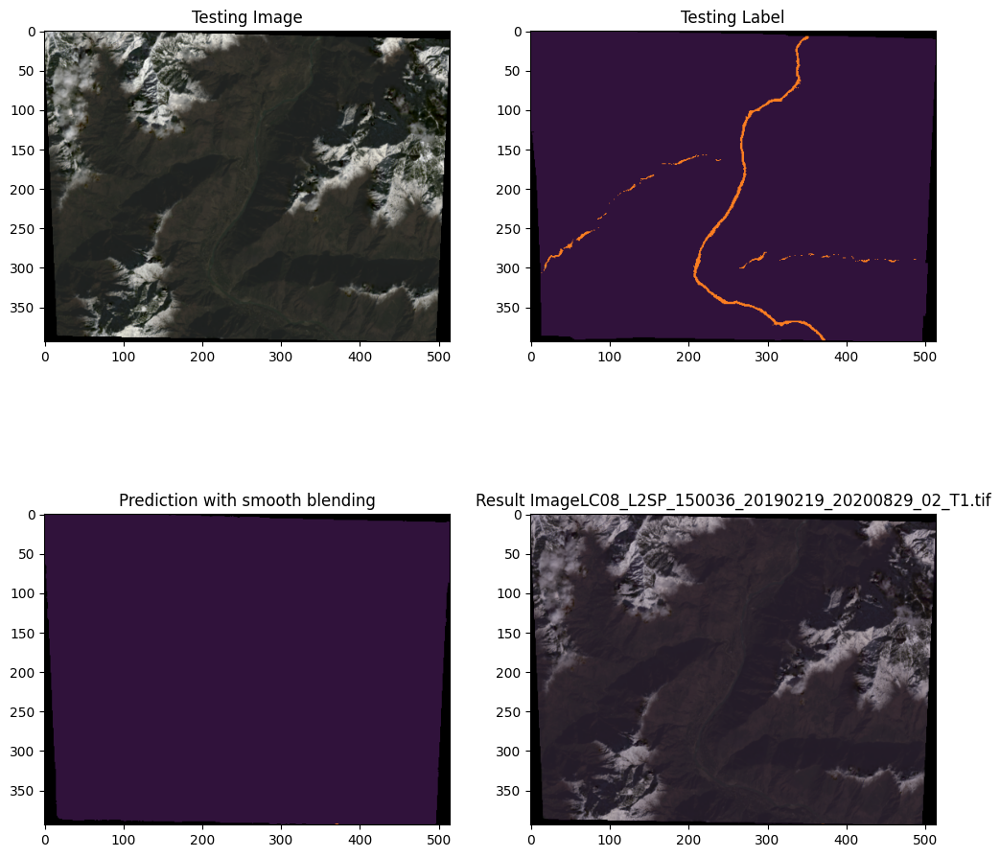

/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/masks_b
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/masks_b_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/images_rgb
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/images_rgb_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/masks_4class_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Besham/masks_4class
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/masks_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/masks_fixed_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/images_raw_pred
1/1 [==============================] - 0s 33ms/step
LC08_L2SP_148036_20140919_20200910_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


 12%|█▎        | 1/8 [00:06<00:48,  6.86s/it]

1/1 [==============================] - 0s 78ms/step


 25%|██▌       | 2/8 [00:08<00:24,  4.01s/it]

1/1 [==============================] - 0s 77ms/step


 38%|███▊      | 3/8 [00:10<00:15,  3.04s/it]

1/1 [==============================] - 0s 76ms/step


 50%|█████     | 4/8 [00:12<00:10,  2.62s/it]

1/1 [==============================] - 0s 76ms/step


 62%|██████▎   | 5/8 [00:14<00:07,  2.35s/it]

1/1 [==============================] - 0s 80ms/step


 75%|███████▌  | 6/8 [00:16<00:04,  2.29s/it]

1/1 [==============================] - 0s 97ms/step


 88%|████████▊ | 7/8 [00:19<00:02,  2.34s/it]

1/1 [==============================] - 0s 77ms/step


100%|██████████| 8/8 [00:21<00:00,  2.66s/it]


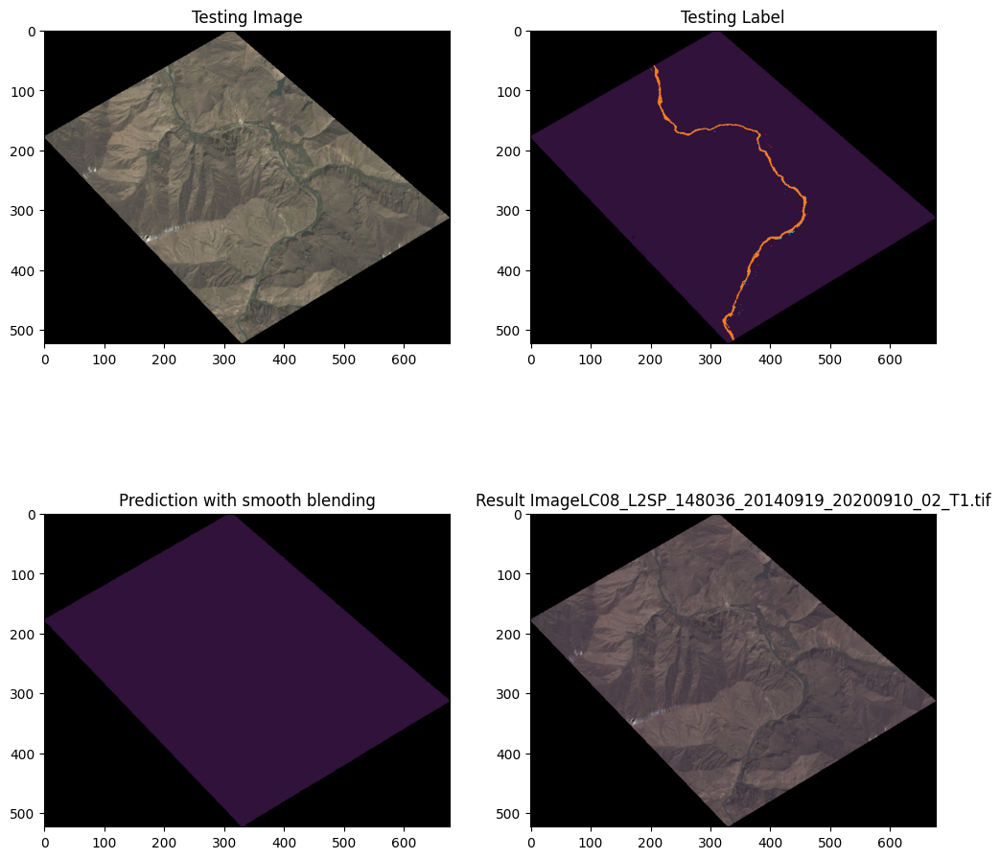

1/1 [==============================] - 0s 31ms/step
LC08_L2SP_148036_20150704_20200909_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


 12%|█▎        | 1/8 [00:01<00:13,  1.96s/it]

1/1 [==============================] - 0s 77ms/step


 25%|██▌       | 2/8 [00:03<00:11,  1.92s/it]

1/1 [==============================] - 0s 78ms/step


 38%|███▊      | 3/8 [00:05<00:09,  1.95s/it]

1/1 [==============================] - 0s 101ms/step


 50%|█████     | 4/8 [00:08<00:08,  2.11s/it]

1/1 [==============================] - 0s 78ms/step


 62%|██████▎   | 5/8 [00:10<00:06,  2.06s/it]

1/1 [==============================] - 0s 77ms/step


 75%|███████▌  | 6/8 [00:11<00:03,  1.98s/it]

1/1 [==============================] - 0s 81ms/step


 88%|████████▊ | 7/8 [00:13<00:01,  1.96s/it]

1/1 [==============================] - 0s 75ms/step


100%|██████████| 8/8 [00:15<00:00,  1.97s/it]


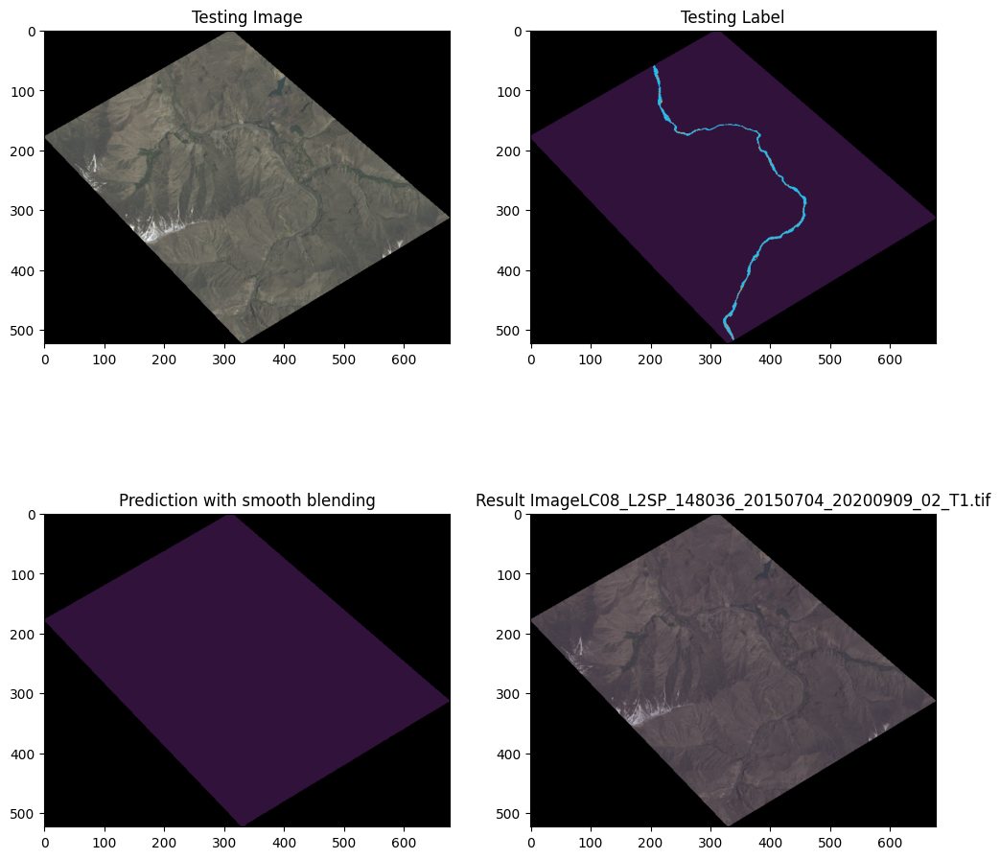

1/1 [==============================] - 0s 31ms/step
LC08_L2SP_148036_20160316_20200907_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 99ms/step


 12%|█▎        | 1/8 [00:02<00:16,  2.33s/it]

1/1 [==============================] - 0s 78ms/step


 25%|██▌       | 2/8 [00:04<00:13,  2.24s/it]

1/1 [==============================] - 0s 80ms/step


 38%|███▊      | 3/8 [00:06<00:10,  2.07s/it]

1/1 [==============================] - 0s 79ms/step


 50%|█████     | 4/8 [00:08<00:07,  2.00s/it]

1/1 [==============================] - 0s 79ms/step


 62%|██████▎   | 5/8 [00:10<00:05,  1.96s/it]

1/1 [==============================] - 0s 77ms/step


 75%|███████▌  | 6/8 [00:12<00:03,  1.93s/it]

1/1 [==============================] - 0s 79ms/step


 88%|████████▊ | 7/8 [00:14<00:01,  1.97s/it]

1/1 [==============================] - 0s 94ms/step


100%|██████████| 8/8 [00:16<00:00,  2.06s/it]


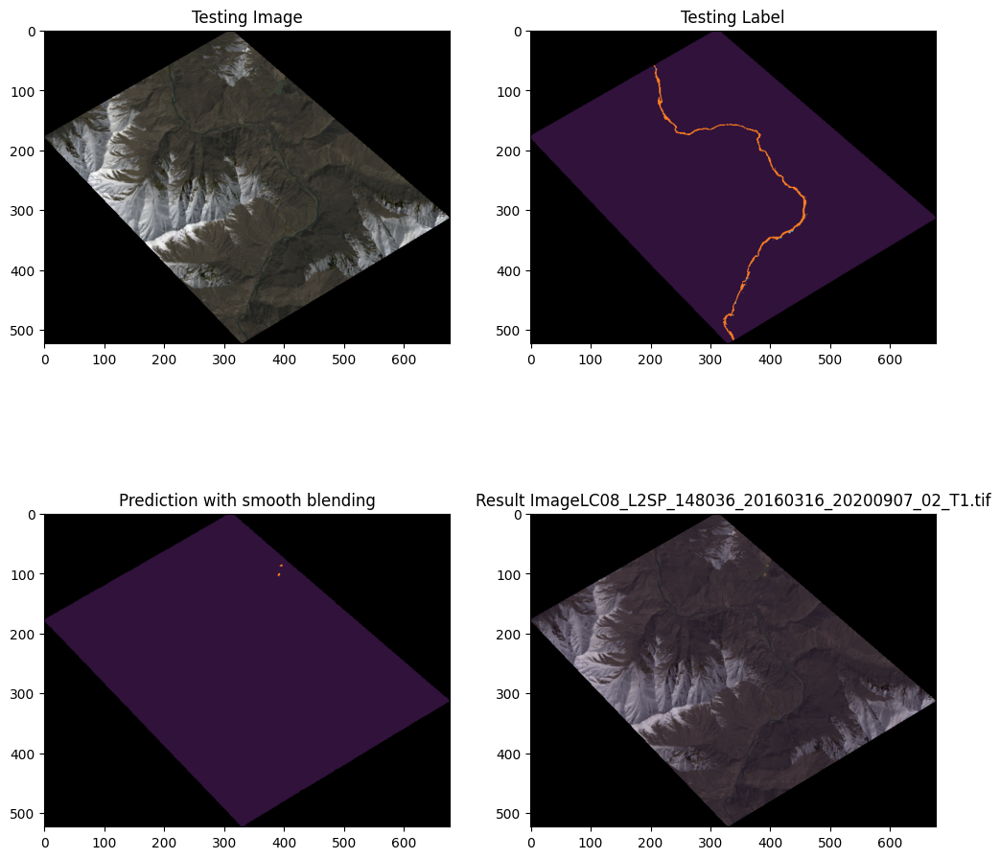

1/1 [==============================] - 0s 29ms/step
LC08_L2SP_148036_20181203_20200830_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


 12%|█▎        | 1/8 [00:01<00:13,  1.94s/it]

1/1 [==============================] - 0s 75ms/step


 25%|██▌       | 2/8 [00:03<00:11,  1.87s/it]

1/1 [==============================] - 0s 57ms/step


 38%|███▊      | 3/8 [00:05<00:09,  1.82s/it]

1/1 [==============================] - 0s 86ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.87s/it]

1/1 [==============================] - 0s 94ms/step


 62%|██████▎   | 5/8 [00:09<00:06,  2.03s/it]

1/1 [==============================] - 0s 56ms/step


 75%|███████▌  | 6/8 [00:11<00:04,  2.05s/it]

1/1 [==============================] - 0s 75ms/step


 88%|████████▊ | 7/8 [00:13<00:02,  2.00s/it]

1/1 [==============================] - 0s 78ms/step


100%|██████████| 8/8 [00:15<00:00,  1.97s/it]


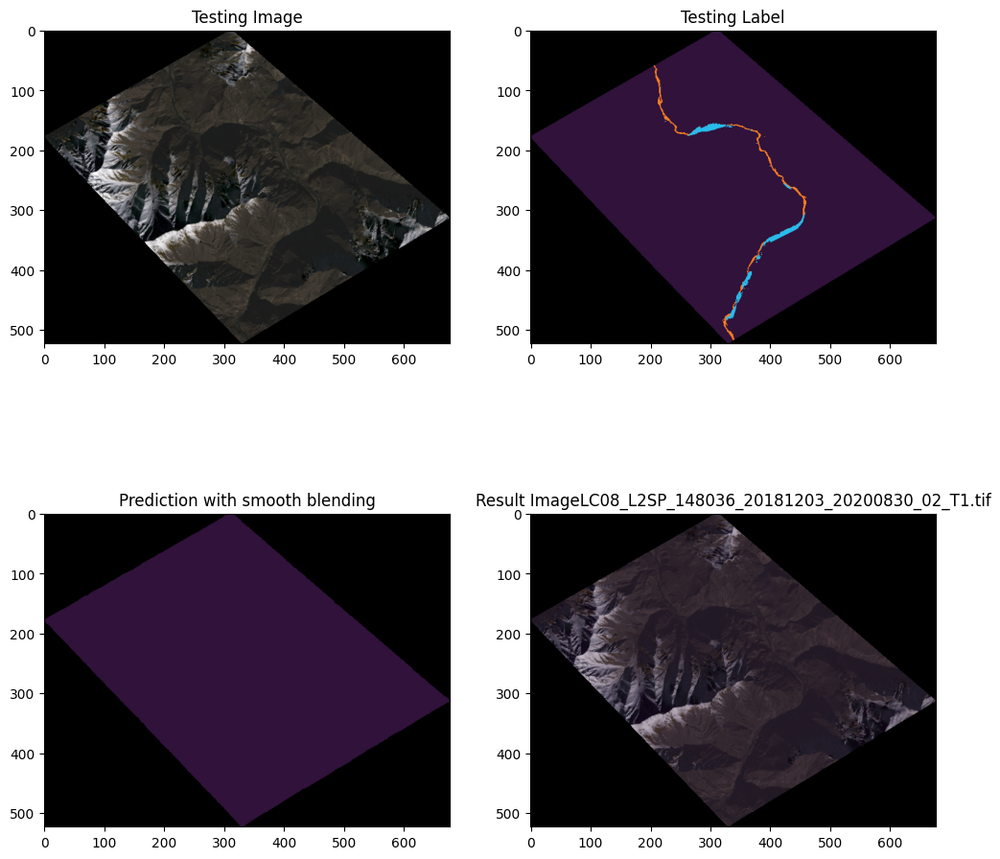

1/1 [==============================] - 0s 30ms/step
LC08_L2SP_148036_20191206_20200824_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


 12%|█▎        | 1/8 [00:01<00:13,  1.99s/it]

1/1 [==============================] - 0s 106ms/step


 25%|██▌       | 2/8 [00:04<00:12,  2.15s/it]

1/1 [==============================] - 0s 98ms/step


 38%|███▊      | 3/8 [00:06<00:10,  2.13s/it]

1/1 [==============================] - 0s 78ms/step


 50%|█████     | 4/8 [00:08<00:08,  2.04s/it]

1/1 [==============================] - 0s 85ms/step


 62%|██████▎   | 5/8 [00:10<00:06,  2.02s/it]

1/1 [==============================] - 0s 77ms/step


 75%|███████▌  | 6/8 [00:12<00:03,  2.00s/it]

1/1 [==============================] - 0s 83ms/step


 88%|████████▊ | 7/8 [00:14<00:01,  2.00s/it]

1/1 [==============================] - 0s 76ms/step


100%|██████████| 8/8 [00:16<00:00,  2.04s/it]


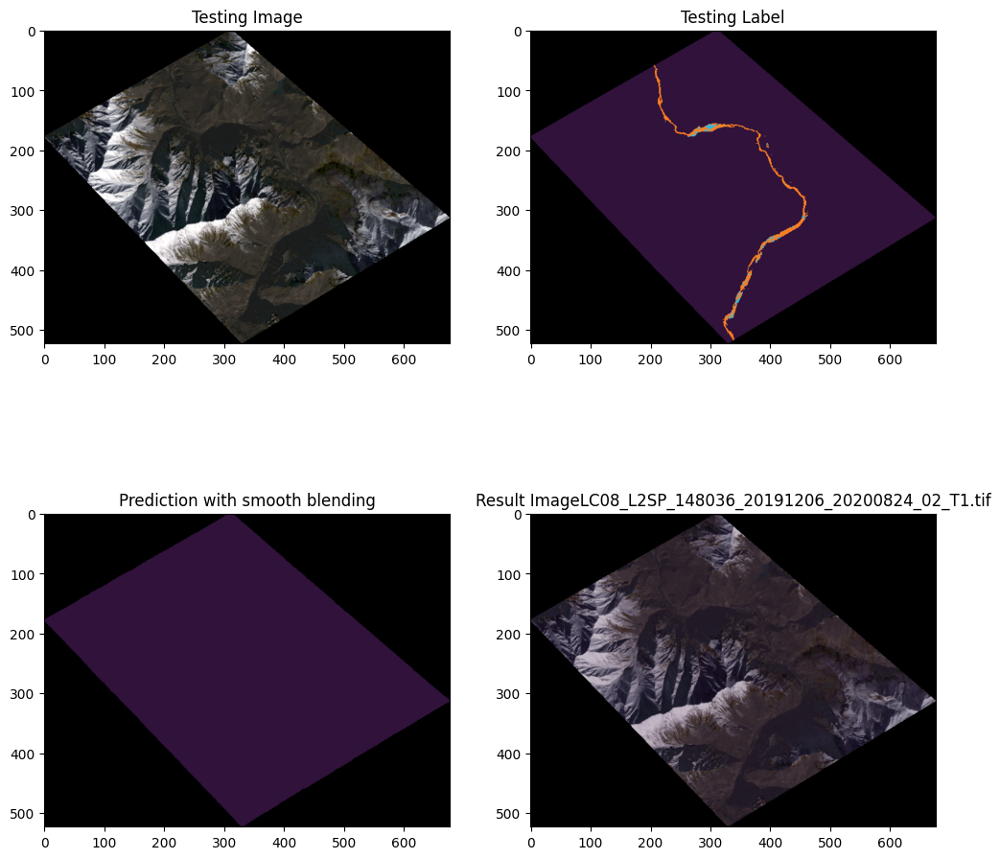

/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/images_raw_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/masks_b_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/masks_b
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/images_rgb_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/images_rgb
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/masks_4class_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kharmong/masks_4class
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/FCN
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/FCN/logs
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/FCN/logs/train
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/images_raw_pred
1/1 [==============================] - 0s 30ms/step
LC08_L2SP_150037_20130914_20200913_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


 12%|█▎        | 1/8 [00:01<00:13,  2.00s/it]

1/1 [==============================] - 0s 82ms/step


 25%|██▌       | 2/8 [00:03<00:11,  1.93s/it]

1/1 [==============================] - 0s 80ms/step


 38%|███▊      | 3/8 [00:05<00:09,  1.92s/it]

1/1 [==============================] - 0s 77ms/step


 50%|█████     | 4/8 [00:07<00:07,  1.91s/it]

1/1 [==============================] - 0s 83ms/step


 62%|██████▎   | 5/8 [00:09<00:05,  1.94s/it]

1/1 [==============================] - 0s 96ms/step


 75%|███████▌  | 6/8 [00:12<00:04,  2.10s/it]

1/1 [==============================] - 0s 77ms/step


 88%|████████▊ | 7/8 [00:14<00:02,  2.08s/it]

1/1 [==============================] - 0s 81ms/step


100%|██████████| 8/8 [00:16<00:00,  2.02s/it]


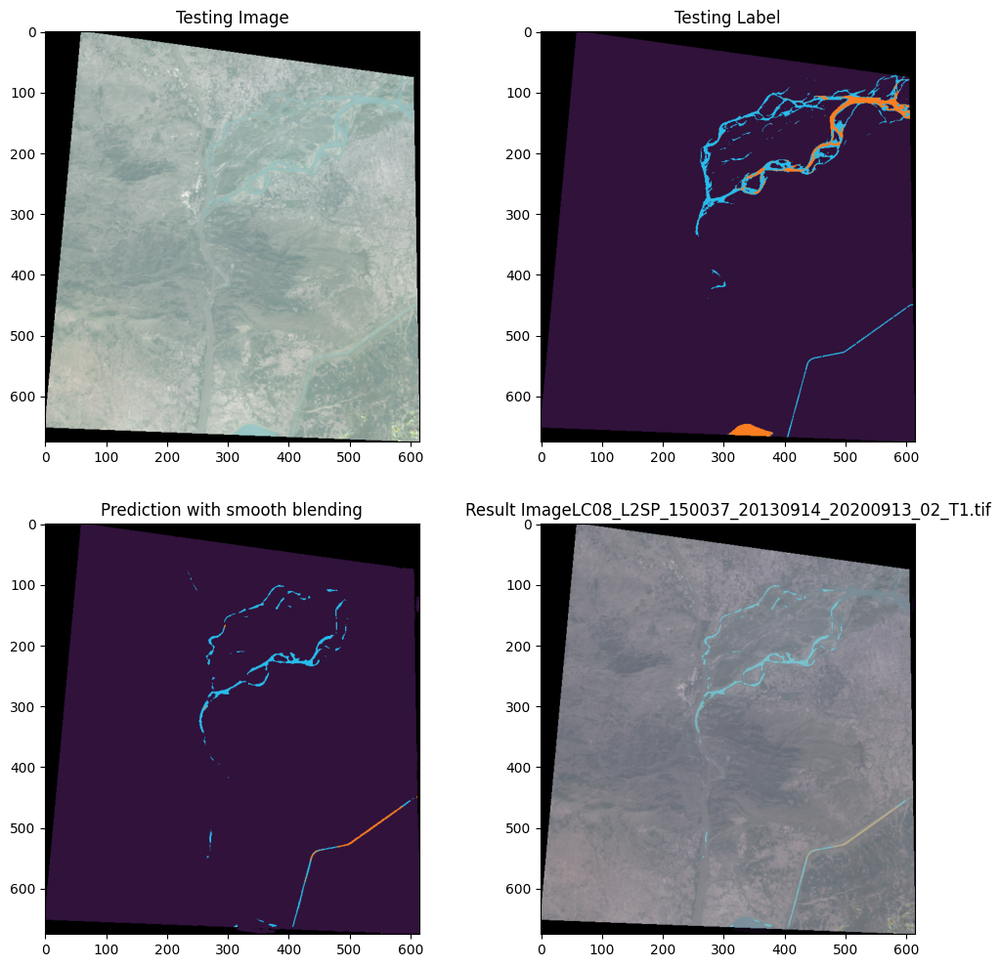

1/1 [==============================] - 0s 29ms/step
LC08_L2SP_150037_20141120_20200910_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


 12%|█▎        | 1/8 [00:01<00:13,  1.98s/it]

1/1 [==============================] - 0s 78ms/step


 25%|██▌       | 2/8 [00:03<00:11,  1.97s/it]

1/1 [==============================] - 0s 91ms/step


 38%|███▊      | 3/8 [00:06<00:10,  2.13s/it]

1/1 [==============================] - 0s 83ms/step


 50%|█████     | 4/8 [00:08<00:08,  2.09s/it]

1/1 [==============================] - 0s 74ms/step


 62%|██████▎   | 5/8 [00:10<00:06,  2.02s/it]

1/1 [==============================] - 0s 78ms/step


 75%|███████▌  | 6/8 [00:12<00:04,  2.01s/it]

1/1 [==============================] - 0s 77ms/step


 88%|████████▊ | 7/8 [00:14<00:01,  1.98s/it]

1/1 [==============================] - 0s 77ms/step


100%|██████████| 8/8 [00:16<00:00,  2.00s/it]


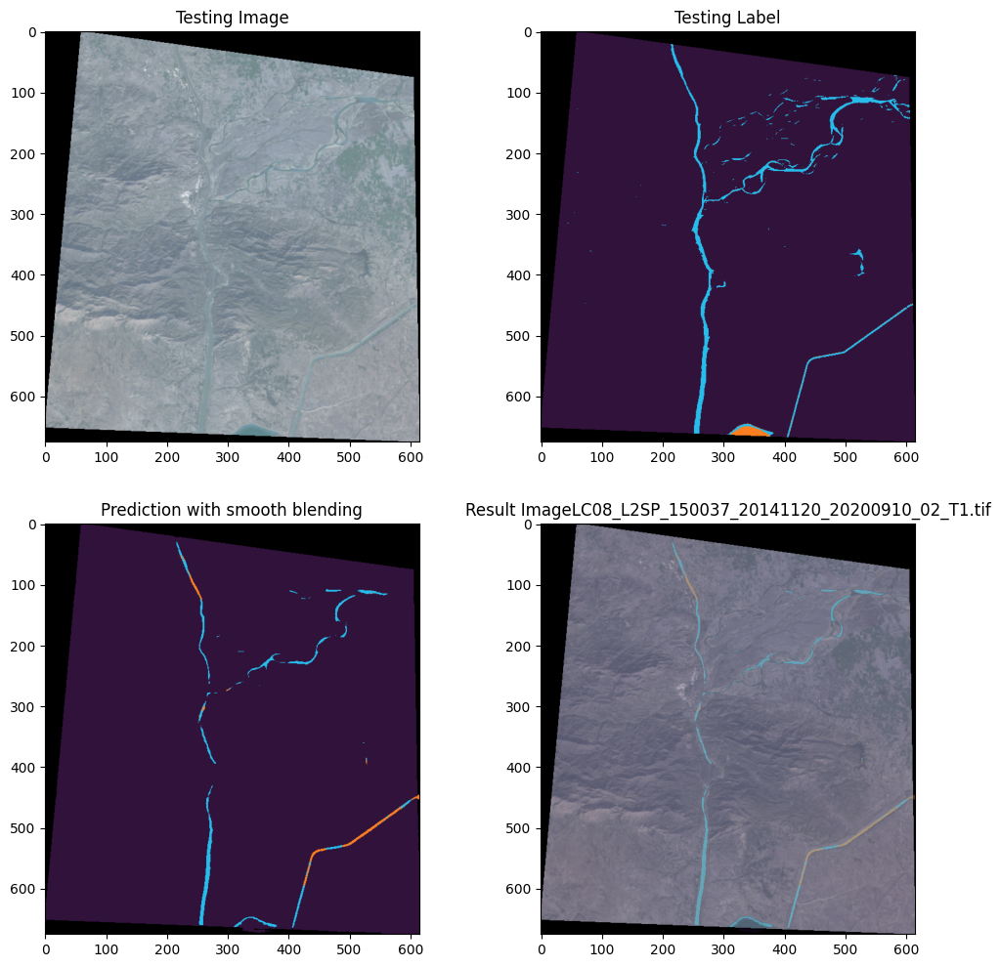

1/1 [==============================] - 0s 43ms/step
LC08_L2SP_150037_20150531_20200909_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 144ms/step


 12%|█▎        | 1/8 [00:02<00:17,  2.43s/it]

1/1 [==============================] - 0s 76ms/step


 25%|██▌       | 2/8 [00:04<00:13,  2.17s/it]

1/1 [==============================] - 0s 77ms/step


 38%|███▊      | 3/8 [00:06<00:10,  2.03s/it]

1/1 [==============================] - 0s 77ms/step


 50%|█████     | 4/8 [00:08<00:08,  2.00s/it]

1/1 [==============================] - 0s 76ms/step


 62%|██████▎   | 5/8 [00:10<00:05,  1.97s/it]

1/1 [==============================] - 0s 80ms/step


 75%|███████▌  | 6/8 [00:12<00:04,  2.04s/it]

1/1 [==============================] - 0s 98ms/step


 88%|████████▊ | 7/8 [00:14<00:02,  2.14s/it]

1/1 [==============================] - 0s 77ms/step


100%|██████████| 8/8 [00:16<00:00,  2.08s/it]


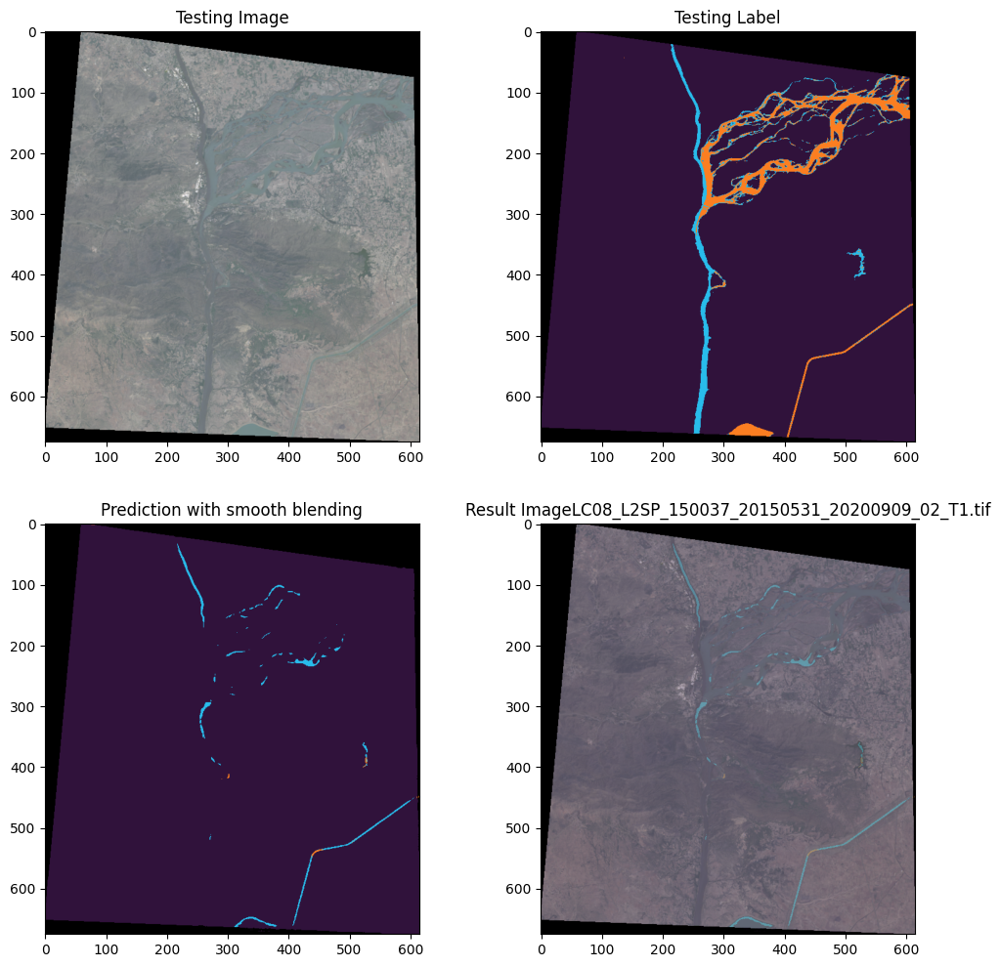

1/1 [==============================] - 0s 55ms/step
LC08_L2SP_150037_20160821_20200906_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 78ms/step


 12%|█▎        | 1/8 [00:02<00:14,  2.05s/it]

1/1 [==============================] - 0s 75ms/step


 25%|██▌       | 2/8 [00:03<00:11,  1.94s/it]

1/1 [==============================] - 0s 79ms/step


 38%|███▊      | 3/8 [00:06<00:10,  2.02s/it]

1/1 [==============================] - 0s 95ms/step


 50%|█████     | 4/8 [00:08<00:08,  2.17s/it]

1/1 [==============================] - 0s 75ms/step


 62%|██████▎   | 5/8 [00:10<00:06,  2.09s/it]

1/1 [==============================] - 0s 79ms/step


 75%|███████▌  | 6/8 [00:12<00:04,  2.06s/it]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 7/8 [00:14<00:02,  2.02s/it]

1/1 [==============================] - 0s 79ms/step


100%|██████████| 8/8 [00:16<00:00,  2.03s/it]


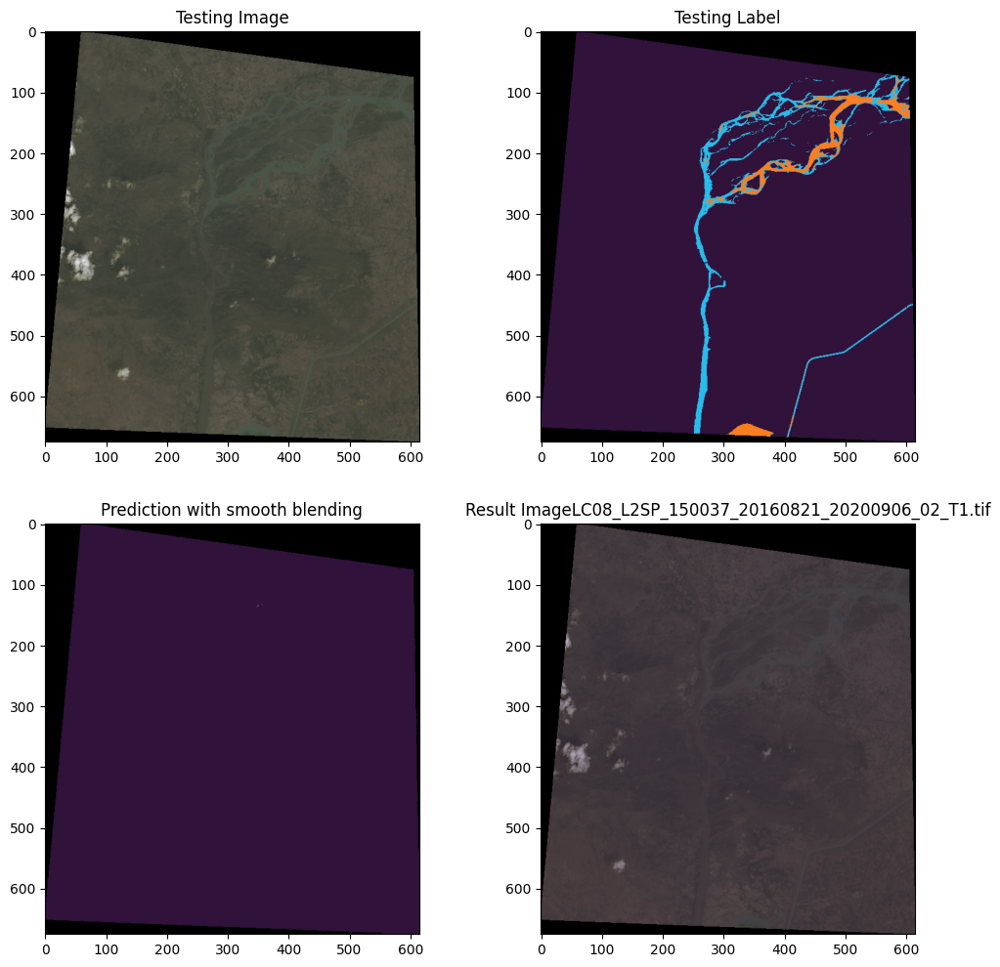

1/1 [==============================] - 0s 32ms/step
LC08_L2SP_150037_20190627_20200827_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

1/1 [==============================] - 0s 104ms/step


 12%|█▎        | 1/8 [00:02<00:19,  2.75s/it]

1/1 [==============================] - 0s 134ms/step


 25%|██▌       | 2/8 [00:05<00:15,  2.65s/it]

1/1 [==============================] - 0s 99ms/step


 38%|███▊      | 3/8 [00:07<00:12,  2.44s/it]

1/1 [==============================] - 0s 79ms/step


 50%|█████     | 4/8 [00:09<00:09,  2.28s/it]

1/1 [==============================] - 0s 80ms/step


 62%|██████▎   | 5/8 [00:11<00:06,  2.17s/it]

1/1 [==============================] - 0s 77ms/step


 75%|███████▌  | 6/8 [00:13<00:04,  2.10s/it]

1/1 [==============================] - 0s 75ms/step


 88%|████████▊ | 7/8 [00:15<00:02,  2.11s/it]

1/1 [==============================] - 0s 109ms/step


100%|██████████| 8/8 [00:18<00:00,  2.28s/it]


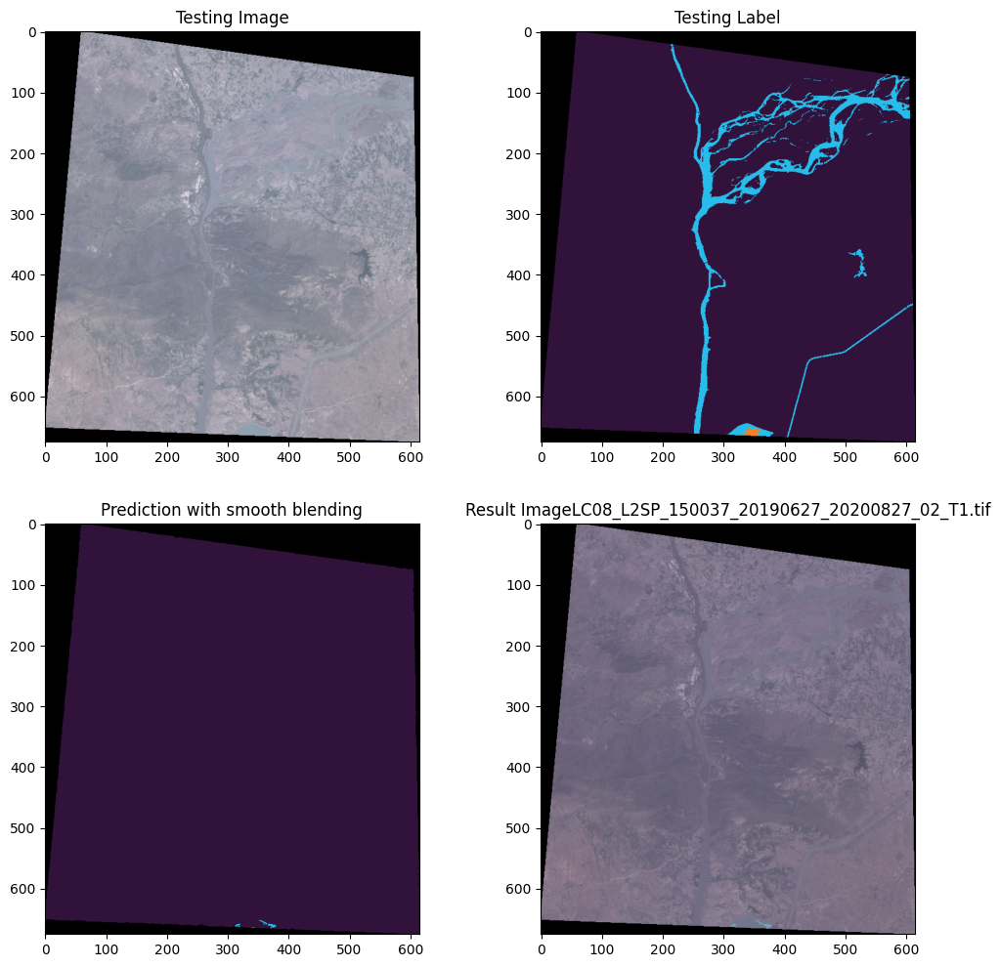

/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/images_raw_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/masks_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/masks_fixed_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/masks_b
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/masks_b_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/images_rgb
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/images_rgb_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/masks_4class_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Khairabad/masks_4class
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/SegnetNew
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/SegnetNew/logs
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/SegnetNew/logs/validation
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/SegnetNew/logs/train
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Unet
/content/gdrive/MyDriv

  0%|          | 0/8 [00:00<?, ?it/s]

2/2 [==============================] - 2s 2s/step


 12%|█▎        | 1/8 [00:04<00:30,  4.36s/it]

2/2 [==============================] - 0s 212ms/step


 25%|██▌       | 2/8 [00:06<00:18,  3.00s/it]

2/2 [==============================] - 0s 232ms/step


 38%|███▊      | 3/8 [00:09<00:14,  2.84s/it]

2/2 [==============================] - 0s 201ms/step


 50%|█████     | 4/8 [00:11<00:10,  2.59s/it]

2/2 [==============================] - 0s 162ms/step


 62%|██████▎   | 5/8 [00:13<00:07,  2.38s/it]

2/2 [==============================] - 0s 204ms/step


 75%|███████▌  | 6/8 [00:15<00:04,  2.28s/it]

2/2 [==============================] - 0s 212ms/step


 88%|████████▊ | 7/8 [00:17<00:02,  2.30s/it]

2/2 [==============================] - 0s 228ms/step


100%|██████████| 8/8 [00:19<00:00,  2.48s/it]


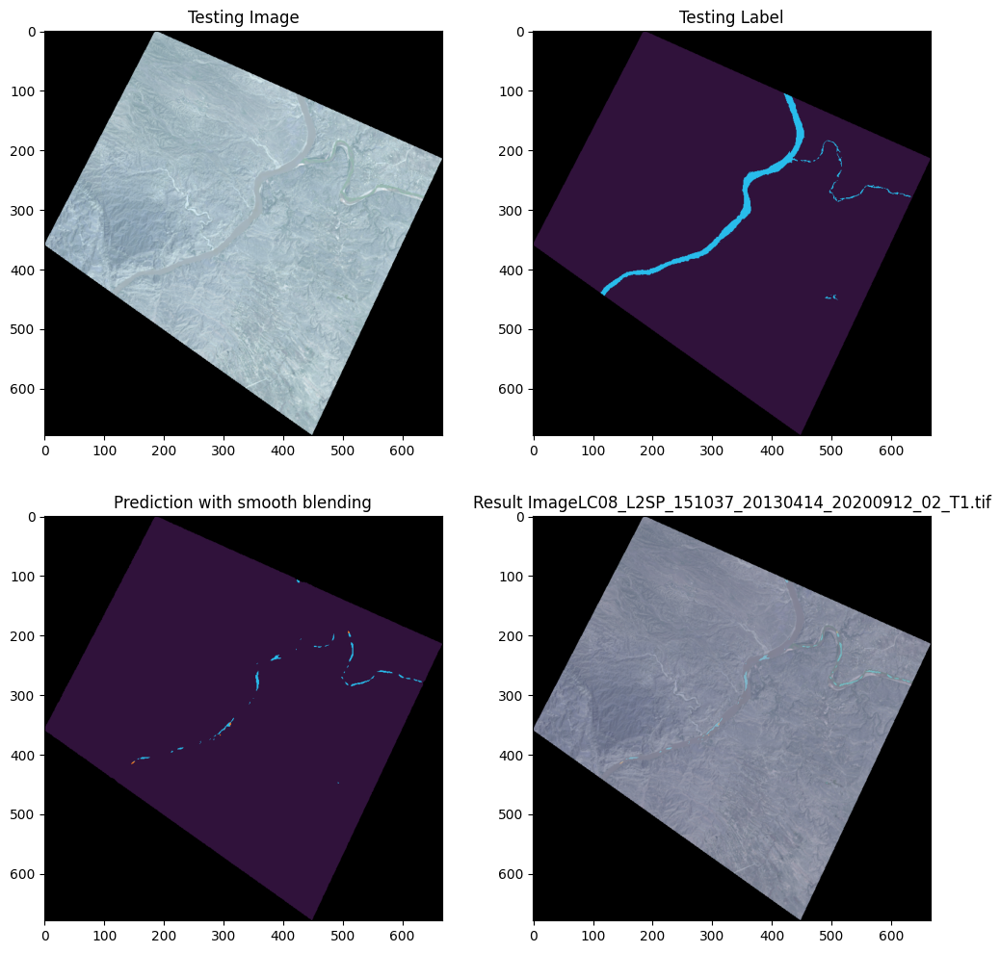

1/1 [==============================] - 0s 31ms/step
LC08_L2SP_151037_20191109_20200825_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

2/2 [==============================] - 0s 227ms/step


 12%|█▎        | 1/8 [00:02<00:15,  2.26s/it]

2/2 [==============================] - 0s 206ms/step


 25%|██▌       | 2/8 [00:04<00:12,  2.13s/it]

2/2 [==============================] - 0s 162ms/step


 38%|███▊      | 3/8 [00:06<00:10,  2.07s/it]

2/2 [==============================] - 0s 198ms/step


 50%|█████     | 4/8 [00:08<00:08,  2.17s/it]

2/2 [==============================] - 0s 231ms/step


 62%|██████▎   | 5/8 [00:11<00:06,  2.29s/it]

2/2 [==============================] - 0s 221ms/step


 75%|███████▌  | 6/8 [00:13<00:04,  2.37s/it]

2/2 [==============================] - 0s 231ms/step


 88%|████████▊ | 7/8 [00:15<00:02,  2.33s/it]

2/2 [==============================] - 0s 219ms/step


100%|██████████| 8/8 [00:18<00:00,  2.27s/it]


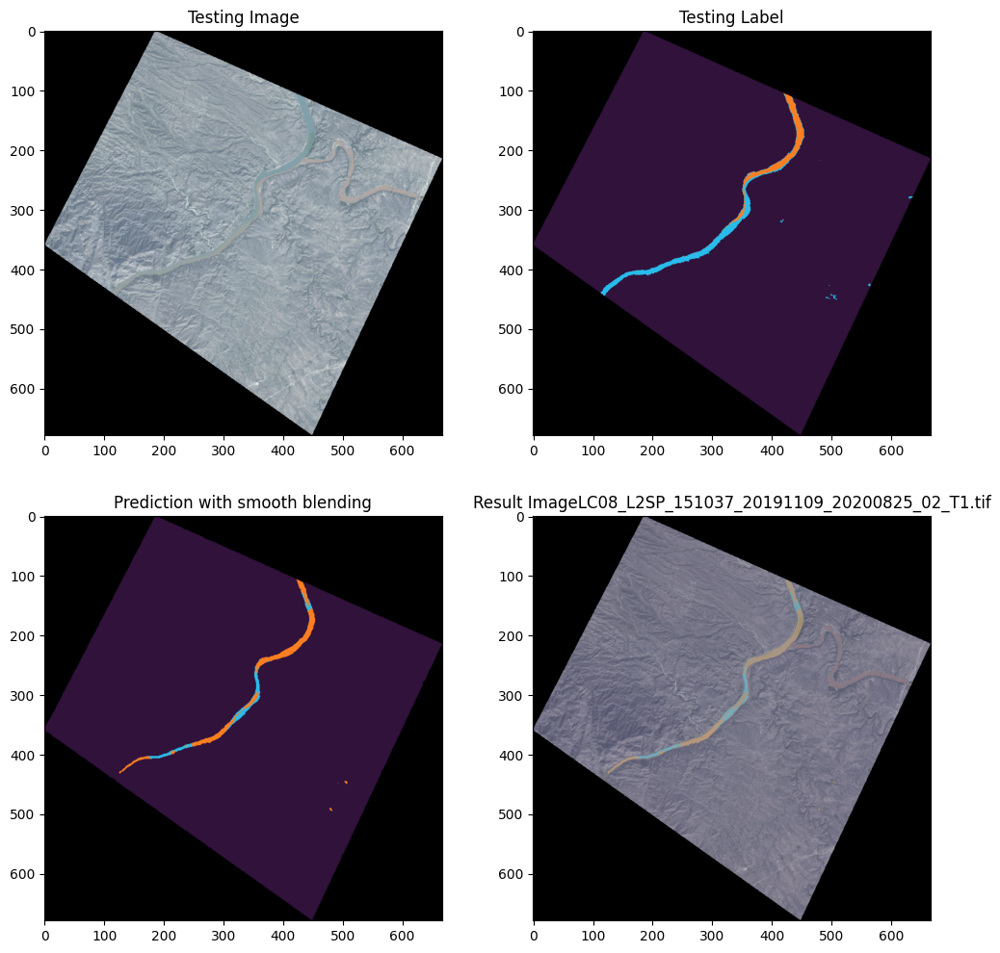

1/1 [==============================] - 0s 33ms/step
LC08_L2SP_151037_20151130_20200908_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

2/2 [==============================] - 0s 206ms/step


 12%|█▎        | 1/8 [00:02<00:16,  2.42s/it]

2/2 [==============================] - 0s 224ms/step


 25%|██▌       | 2/8 [00:05<00:15,  2.66s/it]

2/2 [==============================] - 0s 207ms/step


 38%|███▊      | 3/8 [00:07<00:12,  2.50s/it]

2/2 [==============================] - 0s 222ms/step


 50%|█████     | 4/8 [00:09<00:09,  2.33s/it]

2/2 [==============================] - 0s 220ms/step


 62%|██████▎   | 5/8 [00:11<00:06,  2.31s/it]

2/2 [==============================] - 0s 205ms/step


 75%|███████▌  | 6/8 [00:13<00:04,  2.22s/it]

2/2 [==============================] - 0s 163ms/step


 88%|████████▊ | 7/8 [00:16<00:02,  2.23s/it]

2/2 [==============================] - 0s 215ms/step


100%|██████████| 8/8 [00:18<00:00,  2.37s/it]


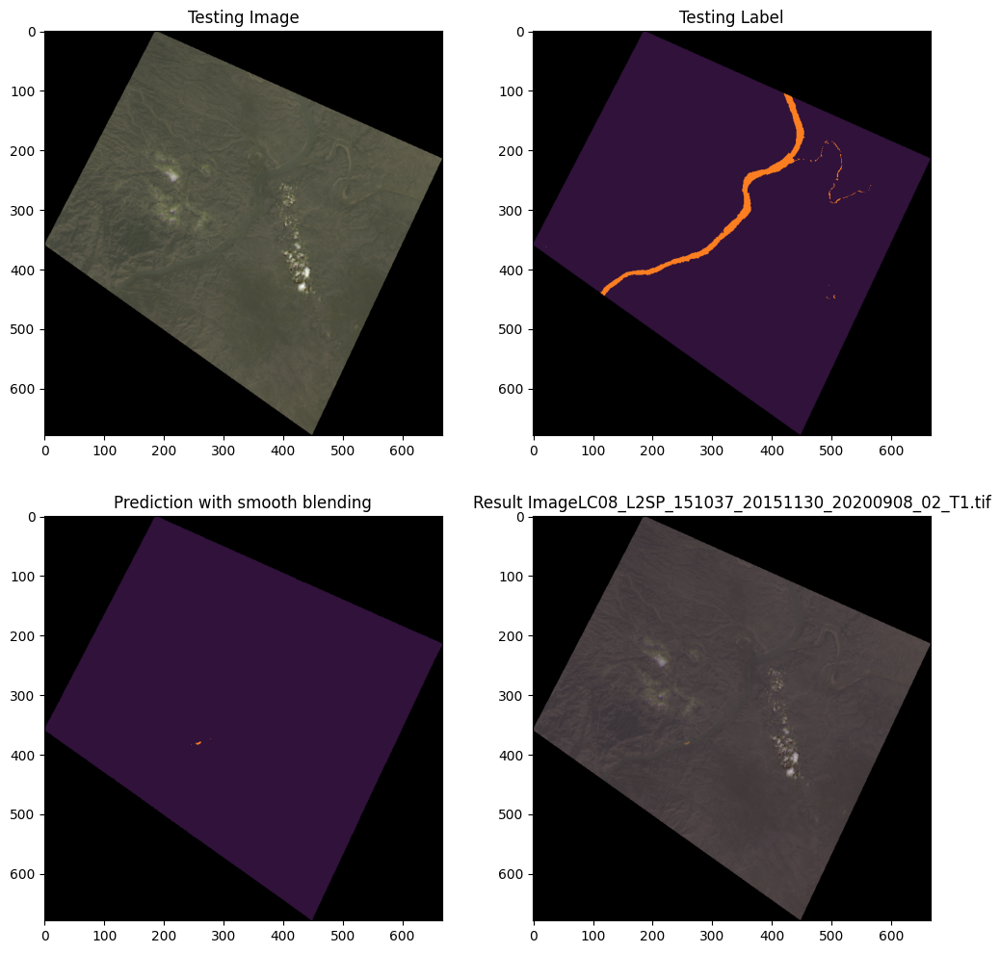

1/1 [==============================] - 0s 30ms/step
LC08_L2SP_151037_20181106_20200830_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

2/2 [==============================] - 0s 209ms/step


 12%|█▎        | 1/8 [00:02<00:16,  2.29s/it]

2/2 [==============================] - 0s 230ms/step


 25%|██▌       | 2/8 [00:04<00:13,  2.31s/it]

2/2 [==============================] - 0s 214ms/step


 38%|███▊      | 3/8 [00:06<00:11,  2.29s/it]

2/2 [==============================] - 0s 230ms/step


 50%|█████     | 4/8 [00:09<00:09,  2.37s/it]

2/2 [==============================] - 0s 222ms/step


 62%|██████▎   | 5/8 [00:11<00:06,  2.32s/it]

2/2 [==============================] - 0s 208ms/step


 75%|███████▌  | 6/8 [00:13<00:04,  2.32s/it]

2/2 [==============================] - 0s 201ms/step


 88%|████████▊ | 7/8 [00:15<00:02,  2.22s/it]

2/2 [==============================] - 0s 161ms/step


100%|██████████| 8/8 [00:17<00:00,  2.24s/it]


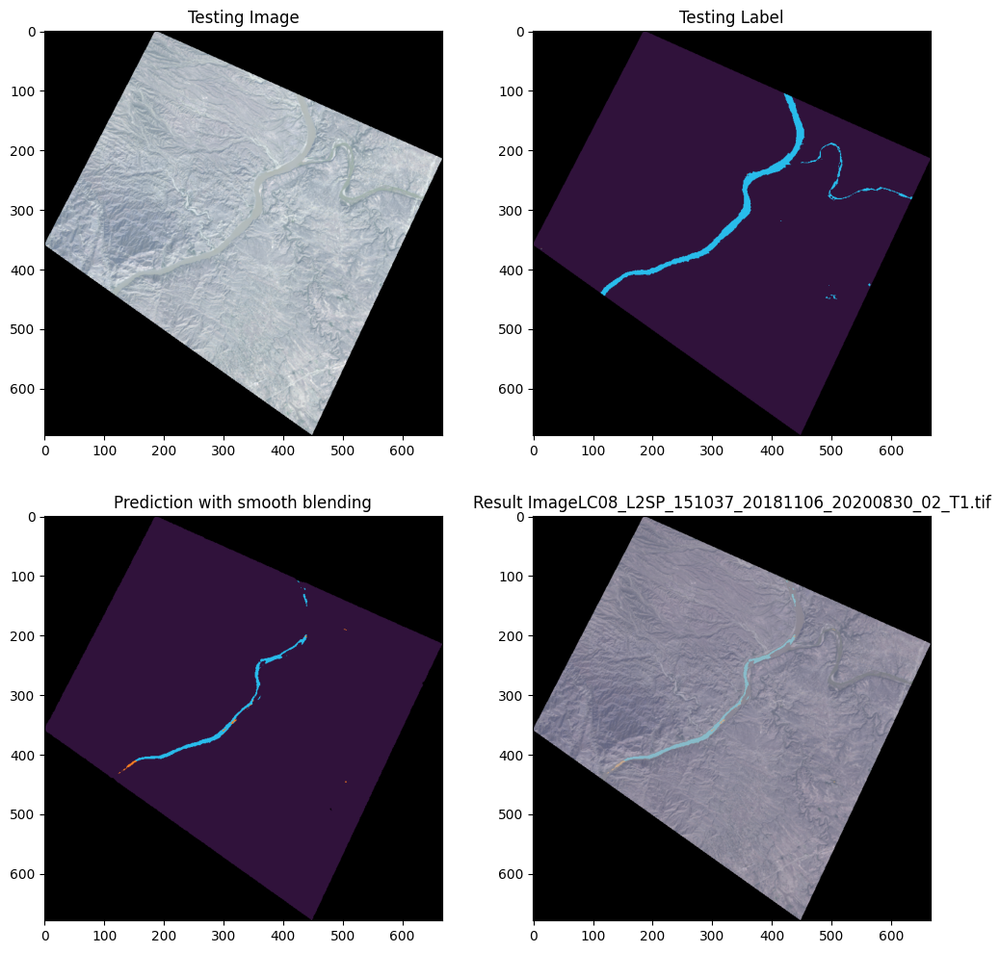

1/1 [==============================] - 0s 34ms/step
LC08_L2SP_151037_20171205_20200902_02_T1.tif


  0%|          | 0/8 [00:00<?, ?it/s]

2/2 [==============================] - 0s 233ms/step


 12%|█▎        | 1/8 [00:02<00:20,  2.97s/it]

2/2 [==============================] - 0s 229ms/step


 25%|██▌       | 2/8 [00:05<00:15,  2.60s/it]

2/2 [==============================] - 0s 214ms/step


 38%|███▊      | 3/8 [00:07<00:12,  2.44s/it]

2/2 [==============================] - 0s 216ms/step


 50%|█████     | 4/8 [00:09<00:09,  2.38s/it]

2/2 [==============================] - 0s 229ms/step


 62%|██████▎   | 5/8 [00:12<00:07,  2.34s/it]

2/2 [==============================] - 0s 208ms/step


 75%|███████▌  | 6/8 [00:14<00:04,  2.25s/it]

2/2 [==============================] - 0s 214ms/step


 88%|████████▊ | 7/8 [00:16<00:02,  2.34s/it]

2/2 [==============================] - 0s 206ms/step


100%|██████████| 8/8 [00:19<00:00,  2.38s/it]


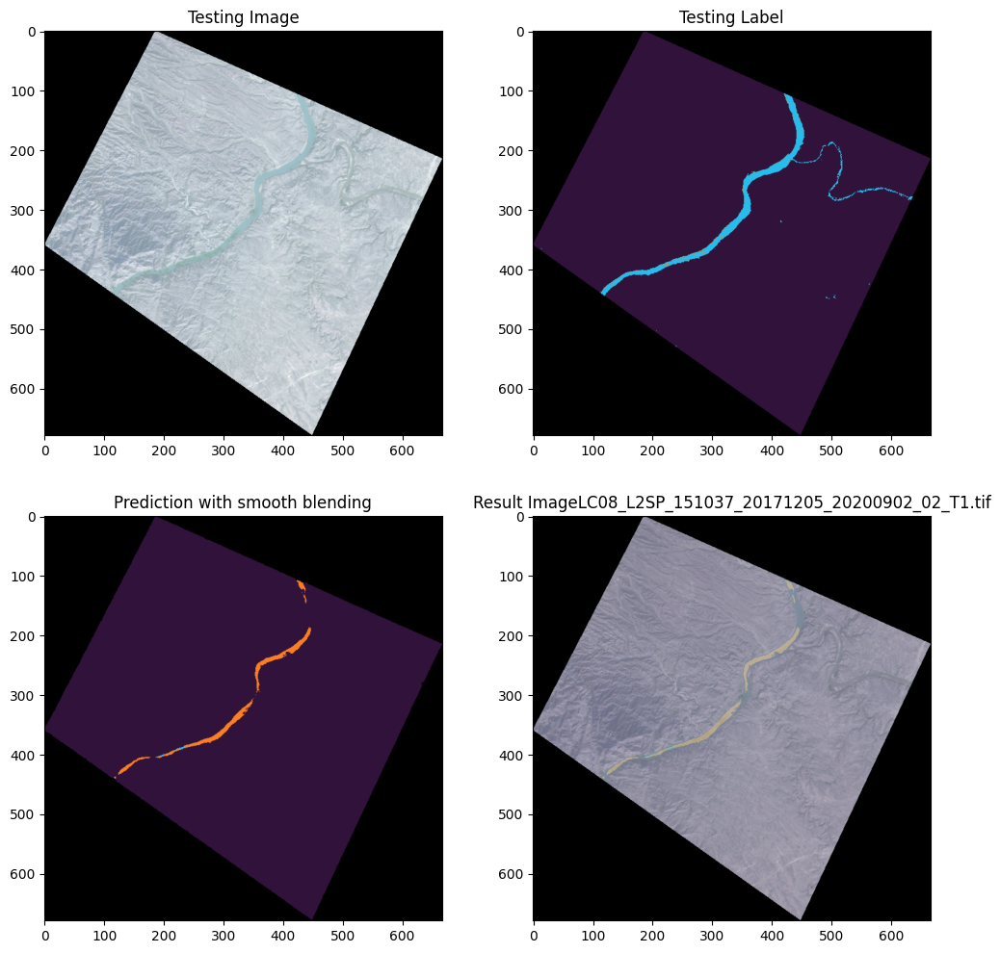

/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Massan/images_raw_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Massan/masks_fixed_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Massan/masks_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Massan/masks_b
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Massan/masks_b_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Massan/images_rgb
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Massan/images_rgb_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Massan/masks_4class
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Massan/masks_4class_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Segnet
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Segnet/logs
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Segnet/logs/validation
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Segnet/logs/train
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/New_Models
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/New_Mo

In [ ]:
#FINAL WORKING FOR ALL IMAGES


def label_to_rgb(predicted_image):
  contaminated = '#FB7E21'.lstrip('#')
  contaminated = np.array(tuple(int(contaminated[i:i+2], 16) for i in (0, 2, 4))) #132, 41, 246

  clear = '#28BCEB'.lstrip('#')
  clear = np.array(tuple(int(clear[i:i+2], 16) for i in (0, 2, 4))) #110, 193, 228

  nowater = '#30123B'.lstrip('#')
  nowater = np.array(tuple(int(nowater[i:i+2], 16) for i in (0, 2, 4))) #226, 169, 41

  nodata = '#000000'.lstrip('#')
  nodata = np.array(tuple(int(nodata[i:i+2], 16) for i in (0, 2, 4))) #226, 169, 41




  segmented_img = np.empty((predicted_image.shape[0], predicted_image.shape[1], 3))

  segmented_img[(predicted_image == 0)] = nodata
  segmented_img[(predicted_image == 1)] = nowater
  segmented_img[(predicted_image == 2)] = clear
  segmented_img[(predicted_image == 3)] = contaminated

  segmented_img = segmented_img.astype(np.uint8)
  return(segmented_img)

root_directory = r"/content/gdrive/MyDrive/NUST MSDS/Processed_Data"

patch_size = 256

images_shapes = []
mask_shapes = []


#image_details = []
#Read images from repsective 'images' subdirectory
#As all images are of ddifferent size we have 2 options, either resize or crop
#But, some images are too large and some small. Resizing will change the size of real objects.
#Therefore, we will crop them to a nearest size divisible by 256 and then
#divide all images into patches of 256x256x3.
image_dataset = []
for path, subdirs, files in os.walk(root_directory):
    print(path)
    dirname = path.split(os.path.sep)[-1]
    #if dirname == 'images_raw' and (path.find('Besham') != -1):   #Find all 'images' directories
    if dirname == 'images_raw_pred':
        images = os.listdir(path)  #List of all image names in this subdirectory
        for i, image_name in enumerate(images):
            if image_name.endswith(".tif"):   #Only read jpg images...

              image_dataset = []
              mask_dataset = []

              image_path = path + '/' + image_name
              image = GeoTiff(image_path)  #Read each image as BGR
              image = image.read()
              image = image[:, :, 0:7]
              image = np.array(image)

              SIZE_X = (image.shape[1]//patch_size)*patch_size #Nearest size divisible by our patch size
              SIZE_Y = (image.shape[0]//patch_size)*patch_size #Nearest size divisible by our patch size
              # NEW for 3 channel image
              # image = image[:, :, 0:3]
              # image = np.array(image)

              ##MARK PART##
              path_mask = path.replace('images_raw_pred', 'masks_4class_pred')
              mask = GeoTiff(path_mask+"/"+image_name)  #Read each image as Grey (or color but remember to map each color to an integer)
              mask = mask.read()
              mask = np.array(mask)


              mask = mask[:, :, 0:3]

              #mask = mask.resize((SIZE_X, SIZE_Y))  #Try not to resize for semantic segmentation

              mask = np.array(mask)
              ##MASK PART END##

              patches_img = patchify(image, (patch_size, patch_size, 7), step=patch_size)  #Step=256 for 256 patches means no overlap
              #patches_img = patchify(image, (patch_size, patch_size, 3), step=patch_size)
              patches_img = patches_img[:,:,0,:,:,:]
              #print(patches_img.shape)

              patched_prediction = []
              for i in range(patches_img.shape[0]):
                  for j in range(patches_img.shape[1]):

                      #single_patch_img = patches_img[i,j,:,:]
                      single_patch_img = patches_img[i,j,:,:,:]
                      #Use minmaxscaler instead of just dividing by 255.
                      #single_patch_img = scaler.fit_transform(single_patch_img.reshape(-1, single_patch_img.shape[-1])).reshape(single_patch_img.shape)

                      #single_patch_img = (single_patch_img.astype('float32')) / 255.
                      #single_patch_img = single_patch_img[0] #Drop the extra unecessary dimension that patchify adds.
                      single_patch_img = np.expand_dims(single_patch_img, axis=0)
                      #print(single_patch_img.shape)
                      pred = model.predict(single_patch_img)
                      pred = np.argmax(pred, axis=3)
                      pred = pred[0, :,:]

                      patched_prediction.append(pred)
                      image_dataset.append(single_patch_img)

              patched_prediction = np.array(patched_prediction)
              image_dataset = np.array(image_dataset)
              input_img = scaler.fit_transform(image.reshape(-1, image.shape[-1])).reshape(image.shape)

              # Use the algorithm. The `pred_func` is passed and will process all the image 8-fold by tiling small patches with overlap, called once with all those image as a batch outer dimension.
              # Note that model.predict(...) accepts a 4D tensor of shape (batch, x, y, nb_channels), such as a Keras model.
              print(image_name)
              predictions_smooth = predict_img_with_smooth_windowing(
                  input_img,
                  window_size=patch_size,
                  subdivisions=2,  # Minimal amount of overlap for windowing. Must be an even number.
                  nb_classes=4,
                  pred_func=(
                      lambda img_batch_subdiv: model.predict((img_batch_subdiv))
                  )
              )


              final_prediction = np.argmax(predictions_smooth, axis=2)

              ########################
              #Plot and save results
              prediction_with_smooth_blending=label_to_rgb(final_prediction)
              #prediction_without_smooth_blending=label_to_rgb(unpatched_prediction)
              test_img = input_img
              # plot_image_R = np.array(test_img[:, :, 2])
              # plot_image_G = np.array(test_img[:, :, 1])
              # plot_image_B = np.array(test_img[:, :, 0])
              plot_image_R = np.array(test_img[:, :, 3])
              plot_image_G = np.array(test_img[:, :, 2])
              plot_image_B = np.array(test_img[:, :, 1])
              plot_image = np.dstack((plot_image_R, plot_image_G, plot_image_B))
              test_img = (plot_image * 255.999).astype(np.uint8)
              blended_image = cv2.addWeighted(test_img, 0.7, prediction_with_smooth_blending, 0.3, 0)
              plt.figure(figsize=(12, 12))
              plt.subplot(221)
              plt.title('Testing Image')
              plt.imshow(test_img)
              plt.subplot(222)
              plt.title('Testing Label')
              plt.imshow(mask)
              plt.subplot(223)
              #plt.title('Prediction without smooth blending')
              #plt.imshow(prediction_without_smooth_blending)
              plt.title('Prediction with smooth blending')
              plt.imshow(prediction_with_smooth_blending)
              plt.subplot(224)
              plt.title('Result Image' + image_name)
              plt.imshow(blended_image)
              plt.savefig('/content/gdrive/MyDrive/NUST MSDS/Processed_Data/New_Models/FCN_150/Outputs/7ch_FCN_150_' + image_name + '.png', format='png')
              plt.show()


#### Load Prediction images

In [ ]:
root_directory = r"/content/gdrive/MyDrive/NUST MSDS/Processed_Data"

patch_size = 256

images_shapes = []
mask_shapes = []

count_images = 0
count_masks = 0

#image_details = []
#Read images from repsective 'images' subdirectory
#As all images are of ddifferent size we have 2 options, either resize or crop
#But, some images are too large and some small. Resizing will change the size of real objects.
#Therefore, we will crop them to a nearest size divisible by 256 and then
#divide all images into patches of 256x256x3.
pred_image_dataset = []

pred_mask_dataset = []

for path, subdirs, files in os.walk(root_directory):
    print(path)
    dirname = path.split(os.path.sep)[-1]
    #if dirname == 'images_raw_fixed' and (path.find('Massan') != -1):   #Find all 'images' directories
    if dirname == 'images_raw_pred':
        images = os.listdir(path)  #List of all image names in this subdirectory
        for i, image_name in enumerate(images):
            if image_name.endswith(".tif"):   #Only read jpg images...
                image_path = path + '/' + image_name
                image = GeoTiff(image_path)  #Read each image as BGR
                image = image.read()
                image = np.array(image)
                #print(image_name)
                #End Convert to RGB
                #image = open_image(path+"/"+image_name)
                count_images = count_images + 1
                SIZE_X = (image.shape[1]//patch_size)*patch_size #Nearest size divisible by our patch size
                SIZE_Y = (image.shape[0]//patch_size)*patch_size #Nearest size divisible by our patch size
                # NEW for 3 channel image
                # image = image[:, :, 0:3]
                # image = np.array(image)

                #patches_img = patchify(image, (patch_size, patch_size, 3), step=patch_size)  #Step=256 for 256 patches means no overlap
                patches_img = patchify(image, (patch_size, patch_size, 8), step=patch_size)
                num_patches = 0
                for i in range(patches_img.shape[0]):
                    for j in range(patches_img.shape[1]):

                        single_patch_img = patches_img[i,j,:,:]

                        #Use minmaxscaler instead of just dividing by 255.
                        single_patch_img = scaler.fit_transform(single_patch_img.reshape(-1, single_patch_img.shape[-1])).reshape(single_patch_img.shape)

                        #single_patch_img = (single_patch_img.astype('float32')) / 255.
                        single_patch_img = single_patch_img[0] #Drop the extra unecessary dimension that patchify adds.
                        pred_image_dataset.append(single_patch_img)
                        num_patches = num_patches + 1

                # image_details.append((count_images, image_name, num_patches))

                mask_name = image_name
                mask_path = path.replace('images_raw_pred', 'masks_4class_pred')
                mask = GeoTiff(mask_path+"/"+image_name)  #Read each image as Grey (or color but remember to map each color to an integer)
                mask = mask.read()
                SIZE_X = (mask.shape[1]//patch_size)*patch_size #Nearest size divisible by our patch size
                SIZE_Y = (mask.shape[0]//patch_size)*patch_size #Nearest size divisible by our patch size
                mask = np.array(mask)

                mask = mask[:, :, 0:3]

                mask = np.array(mask)
                patches_mask = patchify(mask, (patch_size, patch_size, 3), step=patch_size)  #Step=256 for 256 patches means no overlap

                num_patches = 0
                count_masks = count_masks + 1
                for i in range(patches_mask.shape[0]):
                    for j in range(patches_mask.shape[1]):

                        single_patch_mask = patches_mask[i,j,:,:]
                        #single_patch_img = (single_patch_img.astype('float32')) / 255. #No need to scale masks, but you can do it if you want
                        single_patch_mask = single_patch_mask[0] #Drop the extra unecessary dimension that patchify adds.
                        pred_mask_dataset.append(single_patch_mask)
                        num_patches = num_patches + 1

                # ask_details.append((count_masks, mask_name, num_patches))

pred_mask_dataset =  np.array(pred_mask_dataset)
pred_image_dataset = np.array(pred_image_dataset)

/content/gdrive/MyDrive/NUST MSDS/Processed_Data
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab/logs
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab/logs/train
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Deeplab/logs/validation
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_raw_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_raw_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_fixed
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_fixed_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_b_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_b
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_rgb
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/images_rgb_pred
/content/gdrive/MyDrive/NUST MSDS/Processed_Data/Kachura/masks_4clas

In [ ]:
print(pred_image_dataset.shape)
print(pred_mask_dataset.shape)

(80, 256, 256, 8)
(80, 256, 256, 3)


In [ ]:
contaminated = '#FB7E21'.lstrip('#')
contaminated = np.array(tuple(int(contaminated[i:i+2], 16) for i in (0, 2, 4))) #132, 41, 246

clear = '#28BCEB'.lstrip('#')
clear = np.array(tuple(int(clear[i:i+2], 16) for i in (0, 2, 4))) #110, 193, 228

nowater = '#30123B'.lstrip('#')
nowater = np.array(tuple(int(nowater[i:i+2], 16) for i in (0, 2, 4))) #226, 169, 41

nodata = '#000000'.lstrip('#')
nodata = np.array(tuple(int(nodata[i:i+2], 16) for i in (0, 2, 4)))
label = single_patch_mask

In [ ]:
labels = []
for i in range(pred_mask_dataset.shape[0]):
    label = rgb_to_2D_label(pred_mask_dataset[i])
    labels.append(label)

labels = np.array(labels)
labels = np.expand_dims(labels, axis=3)


print("Unique labels in label dataset are: ", np.unique(labels))

Unique labels in label dataset are:  [0 1 2 3]


In [ ]:
n_classes = len(np.unique(labels))
from keras.utils import to_categorical
labels_cat = to_categorical(labels, num_classes=n_classes)


from sklearn.model_selection import train_test_split
X_test= pred_image_dataset
y_test = labels_cat

In [ ]:
#IOU
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)
y_test_argmax=np.argmax(y_test, axis=3)


#Using built in keras function for IoU
from keras.metrics import MeanIoU
IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y_test_argmax, y_pred_argmax)
print("Mean IoU = ", IOU_keras.result().numpy())


3/3 [==============================] - 8s 2s/step
Mean IoU =  0.6466018


In [ ]:

model.evaluate(X_test, y_test, batch_size=16)

5/5 [==============================] - 1s 107ms/step - loss: 0.1408 - accuracy: 0.9888 - jacard_coef: 0.9750 - dice_coef: 0.9930 - recall_m: 0.9887 - precision_m: 0.9889 - f1_m: 0.9888


[0.1407986879348755,
 0.9888015985488892,
 0.9750005602836609,
 0.993026852607727,
 0.9887312054634094,
 0.9888936281204224,
 0.9888123273849487]

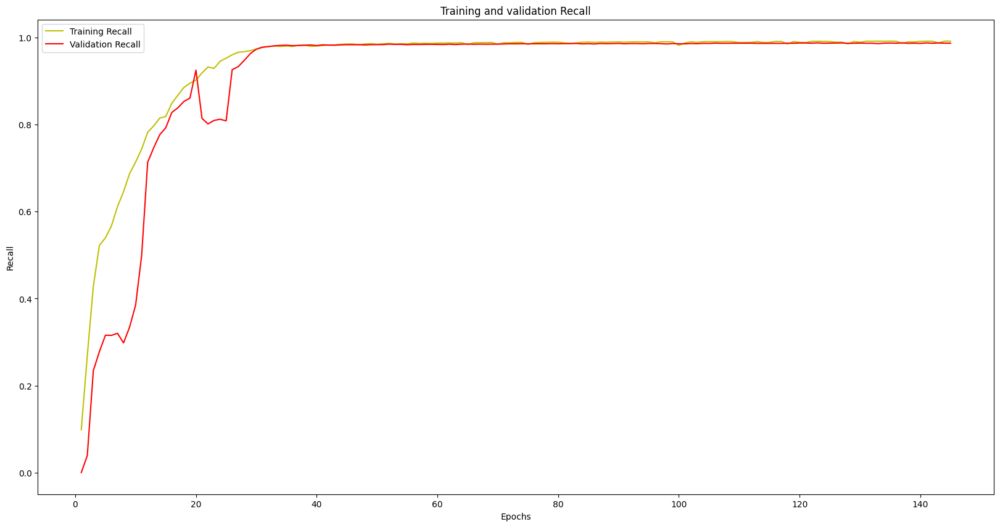

In [ ]:
pre_m = history1.history['recall_m']
val_pre_m = history1.history['val_recall_m']
plt.figure(figsize=(20, 10))
plt.plot(epochs, f1_m, 'y', label='Training Recall')
plt.plot(epochs, val_f1_m, 'r', label='Validation Recall')
plt.title('Training and validation Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()
plt.savefig('New_Models/FCN_150/Recall_FCN_150.svg', format='svg')
plt.savefig('New_Models/FCN_150/Recall_FCN_150.png', format='png')
plt.show()

1/1 [==============================] - 0s 22ms/step


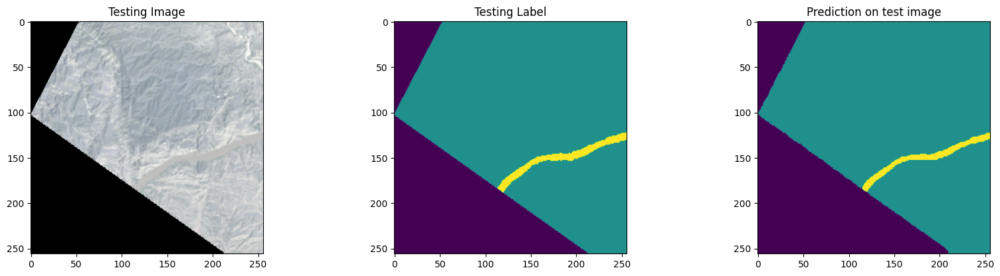

In [ ]:

#######################################################################
#Predict on a few images

import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test_argmax[test_img_number]
#test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]


plot_image_R = np.array(test_img[:,:,3])
plot_image_G = np.array(test_img[:,:,2])
plot_image_B = np.array(test_img[:,:,1])
plot_image = np.dstack((plot_image_R, plot_image_G, plot_image_B))
test_img = (plot_image * 255.999) .astype(np.uint8)
plt.figure(figsize=(20, 10))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(np.reshape(test_img, (patch_size, patch_size, 3)))
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth)
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img)
plt.savefig('New_Models/FCN_150/Prediction_FCN_150.svg', format='svg')
plt.savefig('New_Models/FCN_150/Prediction_FCN_150.png', format='png')
plt.show()

#####################################################################
